# Project
## Student ID: 402101855

---

In [267]:
# Imports
import numpy as np
import matplotlib.pyplot as plt
import cv2
from scipy.ndimage import gaussian_filter
from skimage import img_as_float, img_as_ubyte
from skimage.io import imread
from skimage import io, color, util
from scipy.stats import norm
import math
from scipy.signal import wiener

In [269]:
def load_and_show(image_path, title="Image"):
    image = io.imread(image_path)  # Load the image
    plt.figure(figsize=(6,6))
    plt.imshow(image, cmap='gray')  # Display in grayscale
    plt.title(title)
    plt.axis("off")
    plt.show()
    return image

## <span style="color:#42eff5"> Question 2: Aspects of an Image </span>

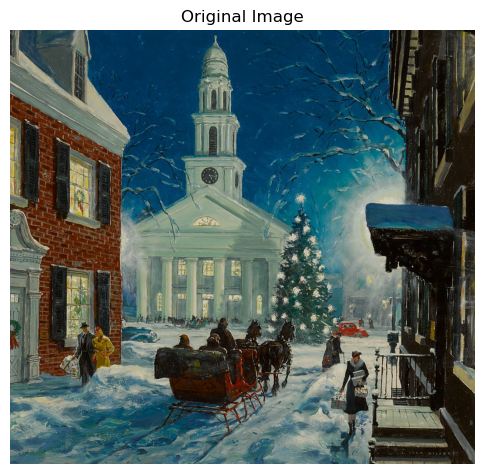

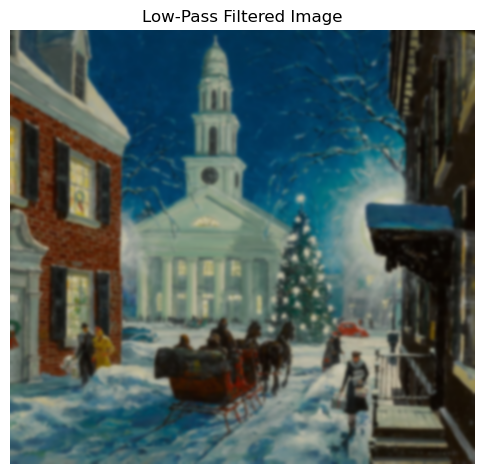

In [25]:
# 2.1

def low_pass_filter(image, kernel_size=15):
    """Applies a Gaussian blur as a low-pass filter."""
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)

image_path = "./pics/christmas_eve.jpg"  # Change this based on the image you want to load
image = load_and_show(image_path, title="Original Image")

# Apply LPF
image_lpf = low_pass_filter(image)
plt.figure(figsize=(6,6))
plt.imshow(image_lpf, cmap='gray')
plt.title("Low-Pass Filtered Image")
plt.axis("off")
plt.show()

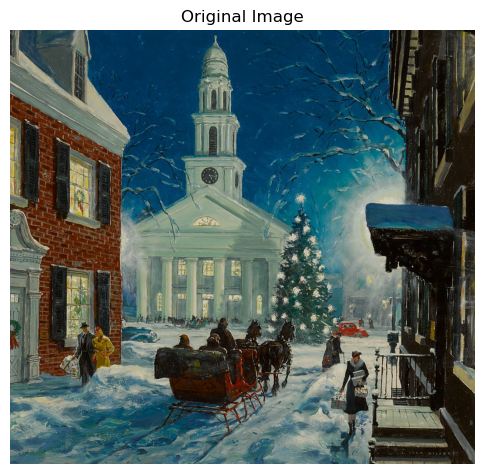

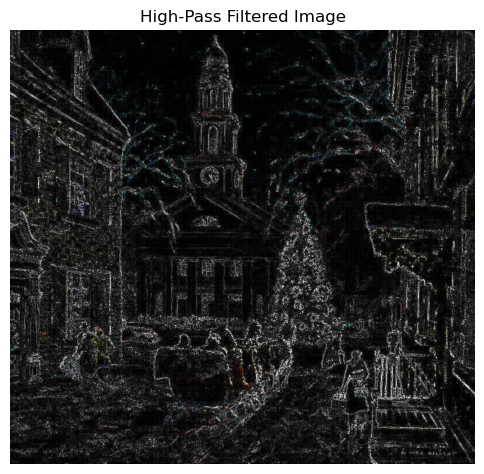

In [23]:
def high_pass_filter_color(image):
    """Applies a Laplacian filter to each color channel separately as a high-pass filter."""
    hpf = np.zeros_like(image, dtype=np.float64)
    for c in range(3):  # Apply HPF to each color channel (R, G, B)
        hpf[:, :, c] = cv2.Laplacian(image[:, :, c], cv2.CV_64F)

    return np.clip(np.abs(hpf), 0, 255).astype(np.uint8)

# Load image
image_path = "./pics/christmas_eve.jpg"
image = load_and_show(image_path, title="Original Image")

# Apply HPF to color image
image_hpf_color = high_pass_filter_color(image)

plt.figure(figsize=(6,6))
plt.imshow(image_hpf_color)
plt.title("High-Pass Filtered Image")
plt.axis("off")
plt.show()

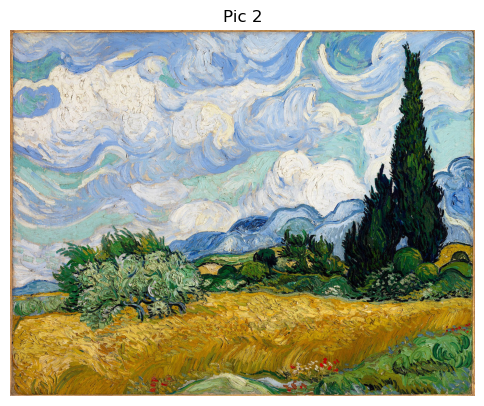

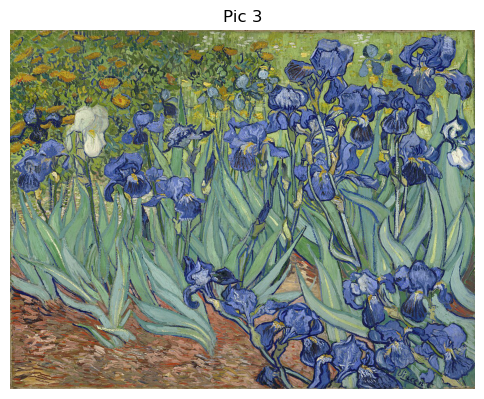

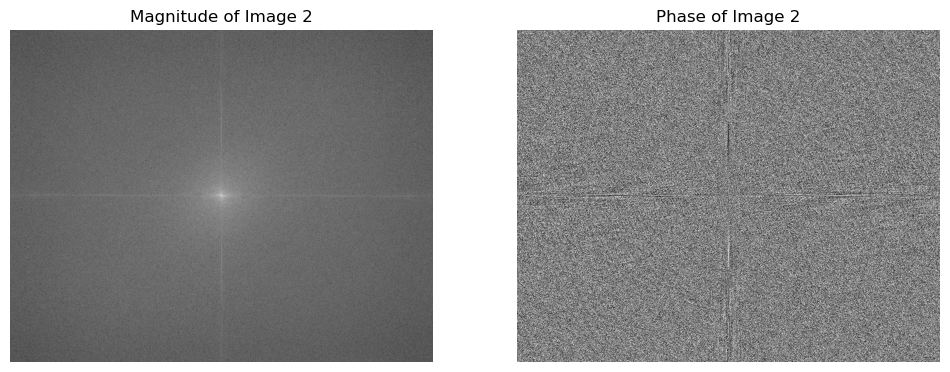

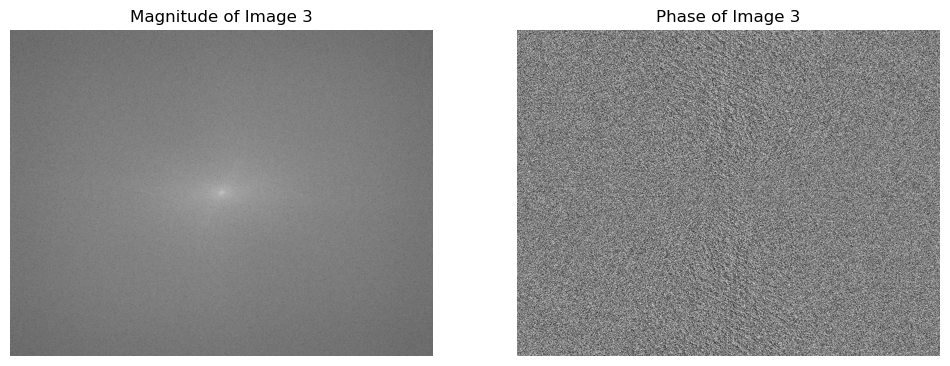

In [29]:
#2.2

def compute_fft_components(image):
    """Computes the FFT, magnitude, and phase of an image."""
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)  # Convert to grayscale
    fft = np.fft.fft2(gray)  # Compute 2D Fourier Transform
    fft_shift = np.fft.fftshift(fft)  # Shift zero frequency to center

    magnitude = np.abs(fft_shift)  # Compute magnitude
    phase = np.angle(fft_shift)  # Compute phase

    return magnitude, phase, fft_shift

# Load images
image_tmp1 = load_and_show("./pics/pic2.jpg", title="Pic 2")
image_tmp2 = load_and_show("./pics/pic3.jpg", title="Pic 3")
image2 = io.imread("./pics/pic2.jpg")
image3 = io.imread("./pics/pic3.jpg")

# Compute magnitude and phase for both images
mag2, phase2, fft2 = compute_fft_components(image2)
mag3, phase3, fft3 = compute_fft_components(image3)

# Display Magnitude and Phase of Image 2
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(np.log(1 + mag2), cmap='gray')
plt.title("Magnitude of Image 2")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(phase2, cmap='gray')
plt.title("Phase of Image 2")
plt.axis("off")
plt.show()

# Display Magnitude and Phase of Image 3
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(np.log(1 + mag3), cmap='gray')
plt.title("Magnitude of Image 3")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(phase3, cmap='gray')
plt.title("Phase of Image 3")
plt.axis("off")
plt.show()

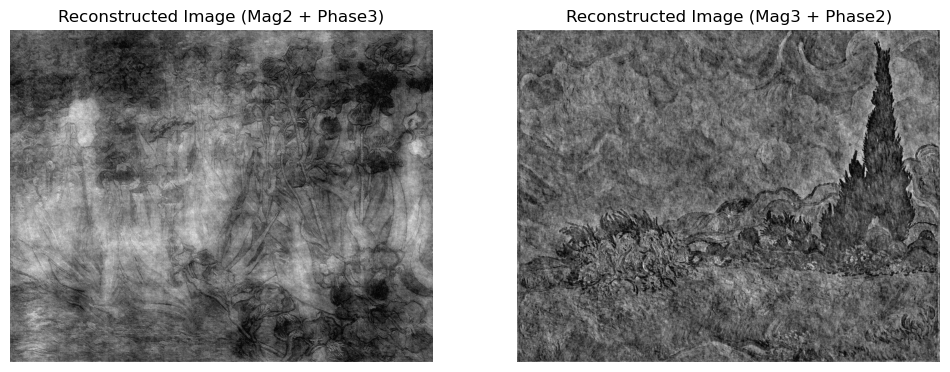

In [33]:
def reconstruct_image(magnitude, phase):
    """Reconstruct image from magnitude and phase components."""
    # Reconstruct the complex FFT image
    real_part = magnitude * np.cos(phase)
    imag_part = magnitude * np.sin(phase)
    fft_reconstructed = real_part + 1j * imag_part
    
    # Inverse FFT to get the image back in spatial domain
    image_reconstructed = np.fft.ifft2(np.fft.ifftshift(fft_reconstructed))
    
    # Take the real part and return as an image
    return np.abs(image_reconstructed)

def resize_image(image, target_shape):
    """Resize image to the target shape while maintaining aspect ratio."""
    return cv2.resize(image, (target_shape[1], target_shape[0]))  # Resize using OpenCV

# Load images
image2 = io.imread("./pics/pic2.jpg")
image3 = io.imread("./pics/pic3.jpg")

# Determine smallest common size
common_shape = (min(image2.shape[0], image3.shape[0]), min(image2.shape[1], image3.shape[1]))

# Resize images
image2_resized = resize_image(image2, common_shape)
image3_resized = resize_image(image3, common_shape)

# Compute magnitude and phase after resizing
mag2, phase2, fft2 = compute_fft_components(image2_resized)
mag3, phase3, fft3 = compute_fft_components(image3_resized)

# Reconstruct images after resizing
image_A = reconstruct_image(mag2, phase3)  # mag2 + phase3
image_B = reconstruct_image(mag3, phase2)  # mag3 + phase2

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(image_A, cmap='gray')
plt.title("Reconstructed Image (Mag2 + Phase3)")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(image_B, cmap='gray')
plt.title("Reconstructed Image (Mag3 + Phase2)")
plt.axis("off")
plt.show()

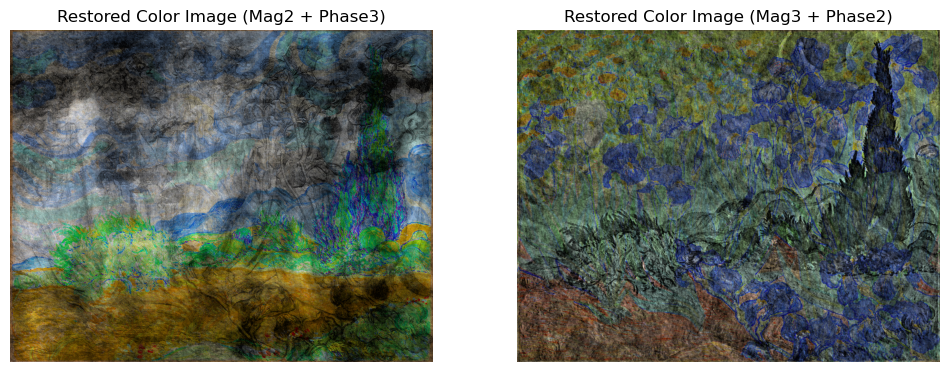

In [26]:
def reconstruct_colored_image(original_color_image, reconstructed_gray_image):
    hsv_image = cv2.cvtColor(original_color_image, cv2.COLOR_RGB2HSV)

    # Normalize the grayscale reconstructed image to match the V channel range (0-255)
    reconstructed_gray_image = cv2.normalize(reconstructed_gray_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Replace the V channel with the reconstructed grayscale image
    hsv_image[:, :, 2] = reconstructed_gray_image

    # Convert back to RGB
    restored_color_image = cv2.cvtColor(hsv_image, cv2.COLOR_HSV2RGB)
    
    return restored_color_image

# Apply color restoration
restored_A = reconstruct_colored_image(image2_resized, image_A)  # Use original colors from image2
restored_B = reconstruct_colored_image(image3_resized, image_B)  # Use original colors from image3

# Display restored images
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(restored_A)
plt.title("Restored Color Image (Mag2 + Phase3)")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(restored_B)
plt.title("Restored Color Image (Mag3 + Phase2)")
plt.axis("off")
plt.show()

## <span style="color:#42eff5"> Question 3: Noise </span>

In [30]:
#3.2.1

def noise(a, L, noise_type="uniform"):
    if noise_type == "uniform":
        return np.random.uniform(-a, a, L)  # Uniform noise in range [-a, a]
    elif noise_type == "normal":
        return np.random.normal(0, a, L)  # Normal noise with mean=0, std=a

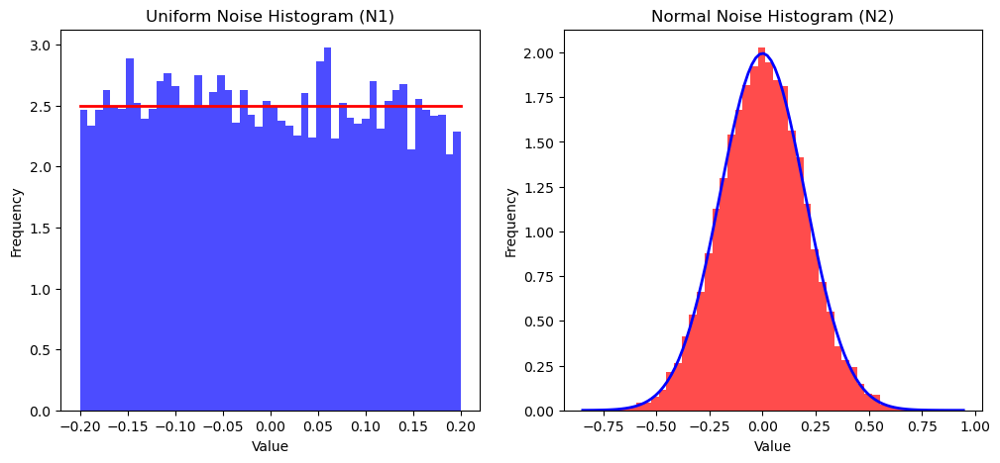

In [45]:
L = 10000
a = 0.2

def noise(amplitude, length, distribution):
    if distribution == "uniform":
        return np.random.uniform(-amplitude, amplitude, length)
    elif distribution == "normal":
        return np.random.normal(0, amplitude, length)

N1 = noise(a, L, "uniform")  # Uniform noise
N2 = noise(a, L, "normal")   # Normal noise

# Plot histograms and theoretical distributions
plt.figure(figsize=(12, 5))

# Uniform noise
plt.subplot(1, 2, 1)
plt.hist(N1, bins=50, color='blue', alpha=0.7, density=True)
x_uniform = np.linspace(-a, a, 100)
plt.plot(x_uniform, [1/(2*a)]*len(x_uniform), 'r-', lw=2)
plt.title("Uniform Noise Histogram (N1)")
plt.xlabel("Value")
plt.ylabel("Frequency")

# Normal noise
plt.subplot(1, 2, 2)
plt.hist(N2, bins=50, color='red', alpha=0.7, density=True)
x_normal = np.linspace(min(N2), max(N2), 100)
plt.plot(x_normal, norm.pdf(x_normal, 0, a), 'b-', lw=2)
plt.title("Normal Noise Histogram (N2)")
plt.xlabel("Value")
plt.ylabel("Frequency")

plt.savefig('foo.png')
plt.show()

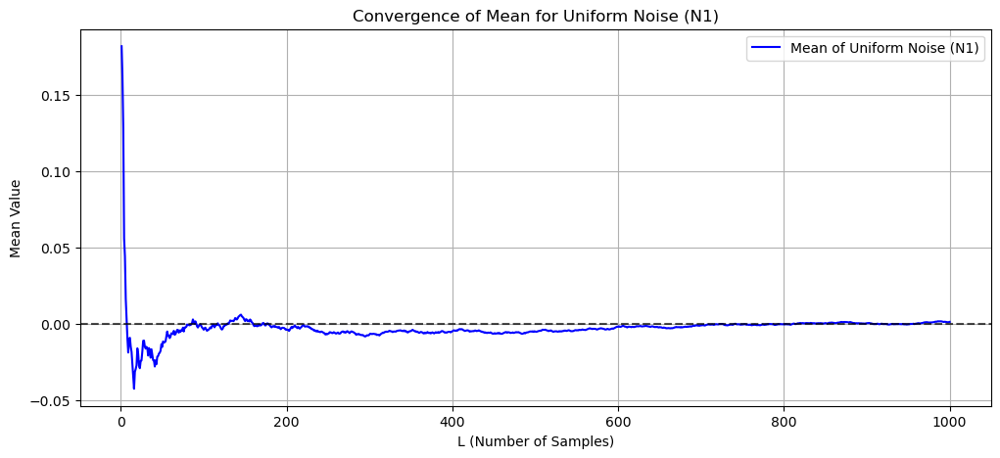

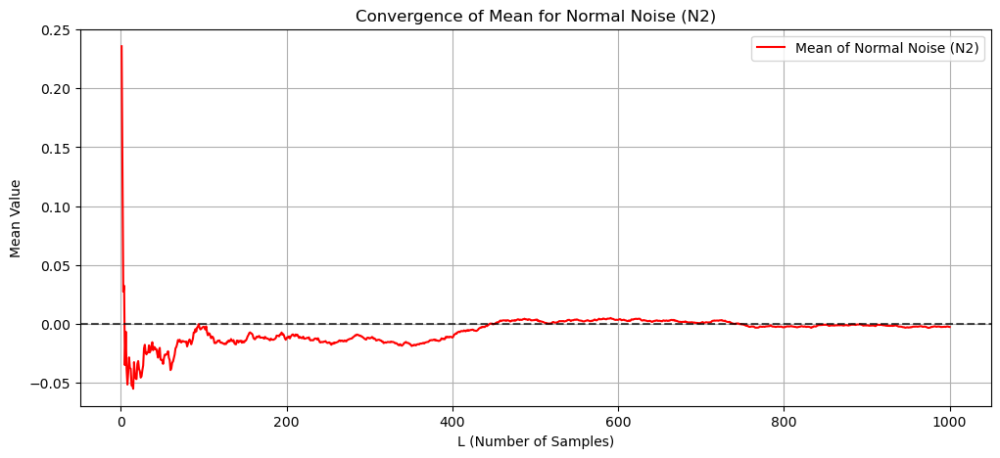

In [63]:
# Generate Noise Vectors
L = 10000  # Length of noise vector
a = 0.2    # Noise amplitude

def noise(amplitude, length, distribution):
    if distribution == "uniform":
        return np.random.uniform(-amplitude, amplitude, length)
    elif distribution == "normal":
        return np.random.normal(0, amplitude, length)

N1 = noise(a, L, "uniform")  # Uniform noise
N2 = noise(a, L, "normal")   # Normal noise

# Compute mean for different values of L
L_values = np.arange(1, 1001)  # L from 1 to 1000
mean_N1 = [np.mean(N1[:L]) for L in L_values]
mean_N2 = [np.mean(N2[:L]) for L in L_values]

# Plot mean vs L for Uniform Noise
plt.figure(figsize=(12, 5))
plt.plot(L_values, mean_N1, label="Mean of Uniform Noise (N1)", color='blue')
plt.axhline(0, linestyle="--", color="black", alpha=0.7)  # Expected mean = 0
plt.title("Convergence of Mean for Uniform Noise (N1)")
plt.xlabel("L (Number of Samples)")
plt.ylabel("Mean Value")
plt.legend()
plt.grid()
plt.show()

# Plot mean vs L for Normal Noise
plt.figure(figsize=(12, 5))
plt.plot(L_values, mean_N2, label="Mean of Normal Noise (N2)", color='red')
plt.axhline(0, linestyle="--", color="black", alpha=0.7)  # Expected mean = 0
plt.title("Convergence of Mean for Normal Noise (N2)")
plt.xlabel("L (Number of Samples)")
plt.ylabel("Mean Value")
plt.legend()
plt.grid()
plt.show()

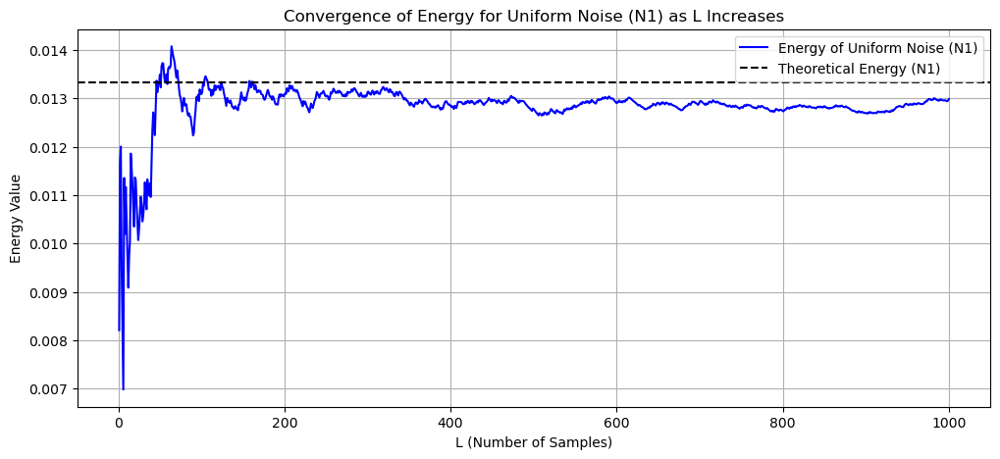

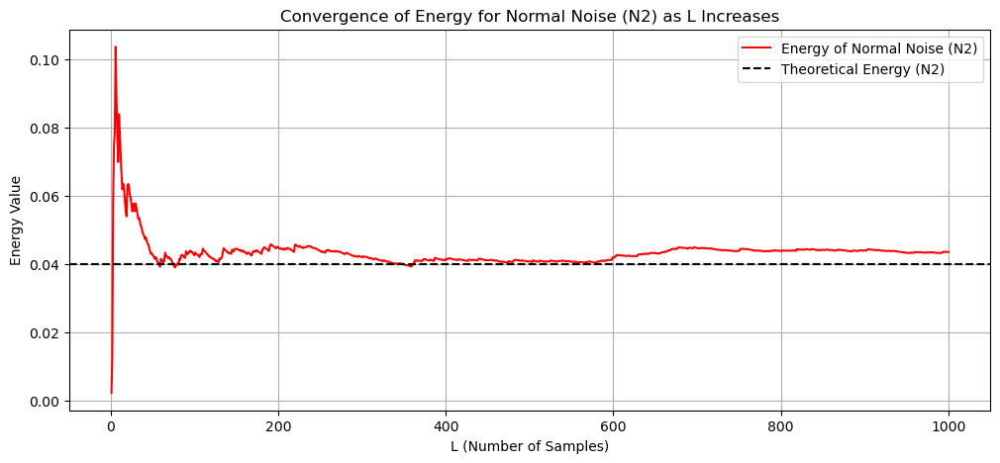

In [75]:
#3.2.2 c

# Generate Noise Vectors
L = 10000  # Length of noise vector
a = 0.2    # Noise amplitude

N1 = noise(a, L, "uniform")  # Uniform noise
N2 = noise(a, L, "normal")   # Normal noise

# Compute mean for different values of L
L_values = np.arange(1, 1001)  # L from 1 to 1000
mean_N1 = [np.mean(N1[:L]) for L in L_values]
mean_N2 = [np.mean(N2[:L]) for L in L_values]

# Compute energy for different L values
energy_N1 = [np.mean(N1[:L]**2) for L in L_values]
energy_N2 = [np.mean(N2[:L]**2) for L in L_values]

# Theoretical values
E_N1_theoretical = (a**2) / 3  # Uniform noise energy
E_N2_theoretical = a**2        # Normal noise energy

# Plot Energy vs L for Uniform Noise
plt.figure(figsize=(12, 5))
plt.plot(L_values, energy_N1, label="Energy of Uniform Noise (N1)", color='blue')
plt.axhline(E_N1_theoretical, linestyle="--", color="black", label="Theoretical Energy (N1)")
plt.title("Convergence of Energy for Uniform Noise (N1) as L Increases")
plt.xlabel("L (Number of Samples)")
plt.ylabel("Energy Value")
plt.legend()
plt.grid()
plt.show()

# Plot Energy vs L for Normal Noise
plt.figure(figsize=(12, 5))
plt.plot(L_values, energy_N2, label="Energy of Normal Noise (N2)", color='red')
plt.axhline(E_N2_theoretical, linestyle="--", color="black", label="Theoretical Energy (N2)")
plt.title("Convergence of Energy for Normal Noise (N2) as L Increases")
plt.xlabel("L (Number of Samples)")
plt.ylabel("Energy Value")
plt.legend()
plt.grid()
plt.show()

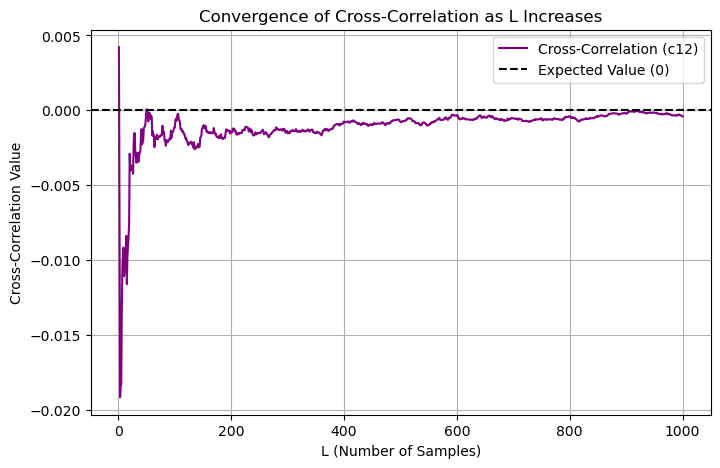

In [77]:
# 3.2.2 (d)

# Compute cross-correlation for different L values
cross_correlation = [np.mean(N1[:L] * N2[:L]) for L in L_values]

# Plot Cross-Correlation vs L
plt.figure(figsize=(8, 5))

plt.plot(L_values, cross_correlation, label="Cross-Correlation (c12)", color='purple')
plt.axhline(0, linestyle="--", color="black", label="Expected Value (0)")
plt.title("Convergence of Cross-Correlation as L Increases")
plt.xlabel("L (Number of Samples)")
plt.ylabel("Cross-Correlation Value")
plt.legend()
plt.grid()

plt.show()


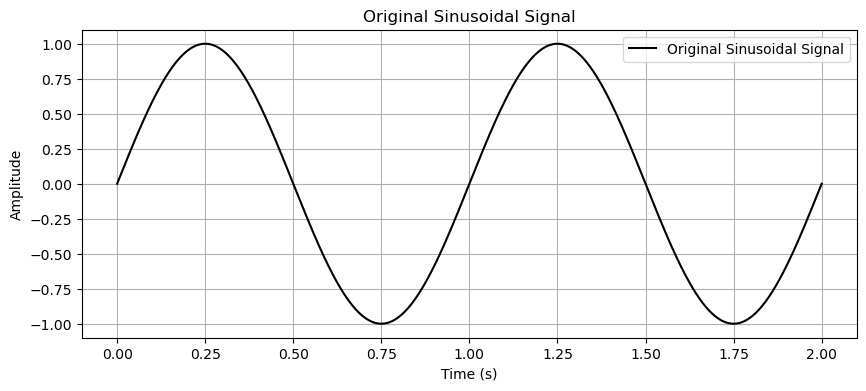

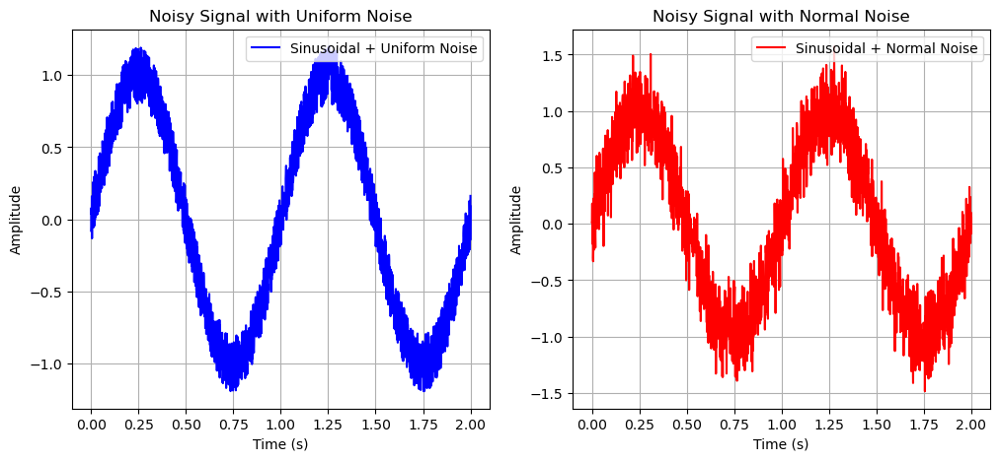

In [87]:
# 3.2.3

# Define parameters
f0 = 1  # Frequency in Hz
sampling_rate = 1000  # High sampling rate for smooth curve
T = 2  # Duration in seconds
t = np.linspace(0, T, T * sampling_rate)  # Time vector

# Generate sinusoidal signal
x_t = np.sin(2 * np.pi * f0 * t)

# Plot the original signal
plt.figure(figsize=(10, 4))
plt.plot(t, x_t, label="Original Sinusoidal Signal", color="black")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title("Original Sinusoidal Signal")
plt.legend()
plt.grid()
plt.show()


# Generate noise vectors for the given length of t
a = 0.2  # Noise amplitude
N1_signal = noise(a, len(t), "uniform")  # Uniform noise
N2_signal = noise(a, len(t), "normal")   # Normal noise

# Create noisy signals
xn1_t = x_t + N1_signal  # Sinusoidal + Uniform noise
xn2_t = x_t + N2_signal  # Sinusoidal + Normal noise

# Plot the noisy signals
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(t, xn1_t, label="Sinusoidal + Uniform Noise", color="blue")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title("Noisy Signal with Uniform Noise")
plt.legend()
plt.grid()

plt.subplot(1, 2, 2)
plt.plot(t, xn2_t, label="Sinusoidal + Normal Noise", color="red")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title("Noisy Signal with Normal Noise")
plt.legend()
plt.grid()

plt.show()

In [89]:
# 3.2.4

def compute_energy(signal):
    return np.mean(signal**2)  # Compute energy using mean squared value


# Compute energy of different signals
E_x = compute_energy(x_t)  # Energy of original sinusoidal signal
E_xn1 = compute_energy(xn1_t)  # Energy of sinusoidal + uniform noise
E_xn2 = compute_energy(xn2_t)  # Energy of sinusoidal + normal noise

print(f"Energy of Original Signal (E_x): {E_x:.4f}")
print(f"Energy of Noisy Signal with Uniform Noise (E_xn1): {E_xn1:.4f}")
print(f"Energy of Noisy Signal with Normal Noise (E_xn2): {E_xn2:.4f}")

Energy of Original Signal (E_x): 0.4998
Energy of Noisy Signal with Uniform Noise (E_xn1): 0.5236
Energy of Noisy Signal with Normal Noise (E_xn2): 0.5350


In [113]:
# 3.2.5

# Compute energy of noise vectors
E_N1 = compute_energy(N1_signal)  # Energy of uniform noise
E_N2 = compute_energy(N2_signal)  # Energy of normal noise

print(f"Energy of Original Signal (E_x): {E_x}")
print(f"Energy of Uniform Noise (E_N1): {E_N1}")
print(f"Energy of Normal Noise (E_N2): {E_N2:.4f}")
print(f"Energy of Noisy Signal with Uniform Noise (E_xn1): {E_xn1:.4f}")
print(f"Energy of Noisy Signal with Normal Noise (E_xn2): {E_xn2:.4f}")

# Check if E_xn1 ≈ E_x + E_N1 and E_xn2 ≈ E_x + E_N2
print(f"E_x + E_N1 ≈ E_xn1? {np.isclose(E_x + E_N1, E_xn1, rtol=0.02)}")
print(f"E_x + E_N2 ≈ E_xn2? {np.isclose(E_x + E_N2, E_xn2, rtol=0.02)}")

Energy of Original Signal (E_x): 0.49975000000000014
Energy of Uniform Noise (E_N1): 0.013443480500168517
Energy of Normal Noise (E_N2): 0.0392
Energy of Noisy Signal with Uniform Noise (E_xn1): 0.5236
Energy of Noisy Signal with Normal Noise (E_xn2): 0.5350
E_x + E_N1 ≈ E_xn1? True
E_x + E_N2 ≈ E_xn2? True


SNR of Signal with Uniform Noise: 37.1742
SNR of Signal with Normal Noise: 12.7375


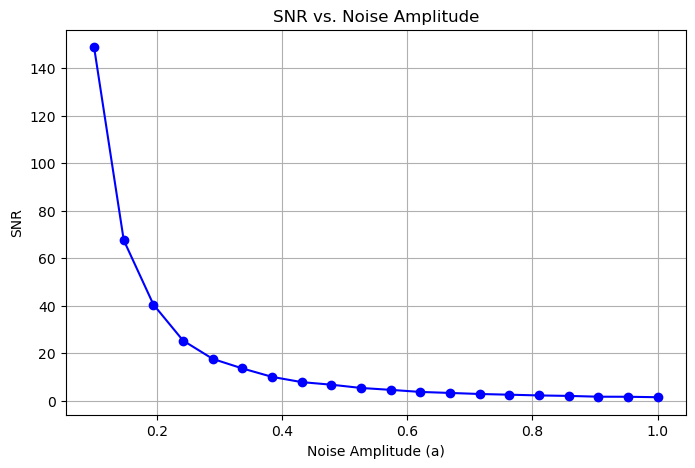

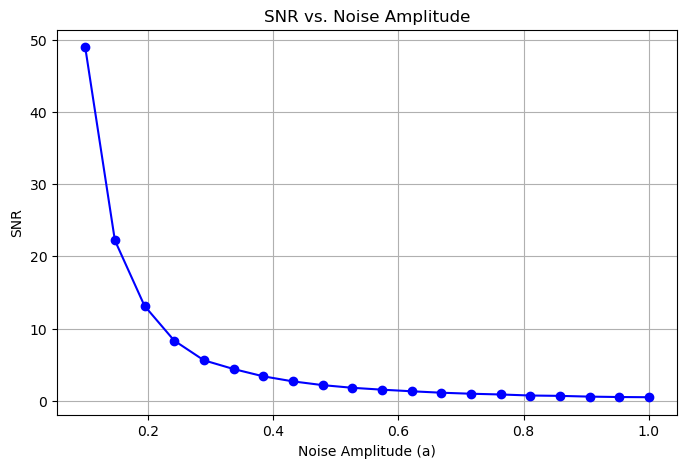

In [119]:
# 3.2.6

def compute_snr(signal_energy, noise_energy):
    return signal_energy / noise_energy

# Compute SNR for noisy signals
SNR_xn1 = compute_snr(E_x, E_N1)
SNR_xn2 = compute_snr(E_x, E_N2)

print(f"SNR of Signal with Uniform Noise: {SNR_xn1:.4f}")
print(f"SNR of Signal with Normal Noise: {SNR_xn2:.4f}")


# Experiment: Increase 'a' until the signal becomes unrecognizable
a_values = np.linspace(0.1, 1.0, 20)
snr_results_1 = []
snr_results_2 = []

for a_test in a_values:
    N1_test = noise(a_test, len(t), "uniform")
    E_N1_test = compute_energy(N1_test)
    SNR_test_1 = compute_snr(E_x, E_N1_test)
    snr_results_1.append(SNR_test_1)

for a_test in a_values:
    N2_test = noise(a_test, len(t), "normal")
    E_N2_test = compute_energy(N2_test)
    SNR_test_2 = compute_snr(E_x, E_N2_test)
    snr_results_2.append(SNR_test_2)

# Plot SNR vs. Noise Level
plt.figure(figsize=(8, 5))
plt.plot(a_values, snr_results_1, marker='o', linestyle='-', color="blue")
plt.xlabel("Noise Amplitude (a)")
plt.ylabel("SNR")
plt.title("SNR vs. Noise Amplitude")
plt.grid()

plt.figure(figsize=(8, 5))
plt.plot(a_values, snr_results_2, marker='o', linestyle='-', color="blue")
plt.xlabel("Noise Amplitude (a)")
plt.ylabel("SNR")
plt.title("SNR vs. Noise Amplitude")
plt.grid()
plt.show()

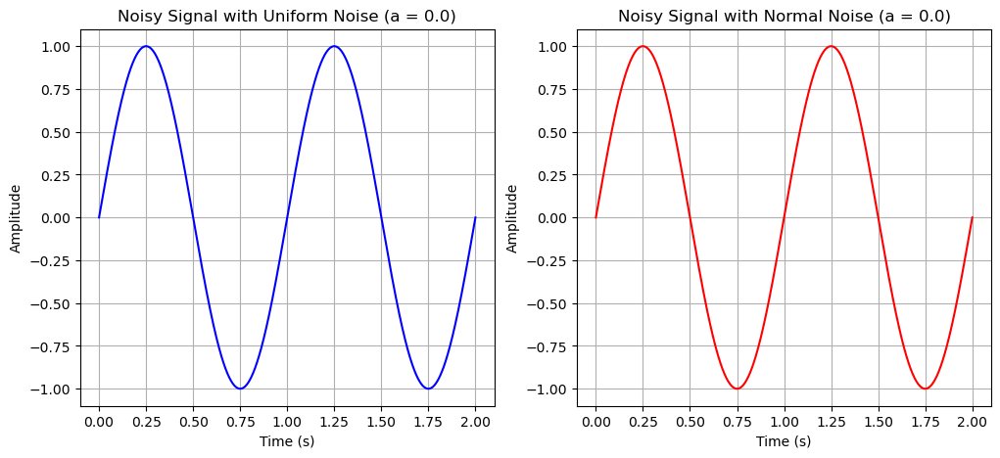

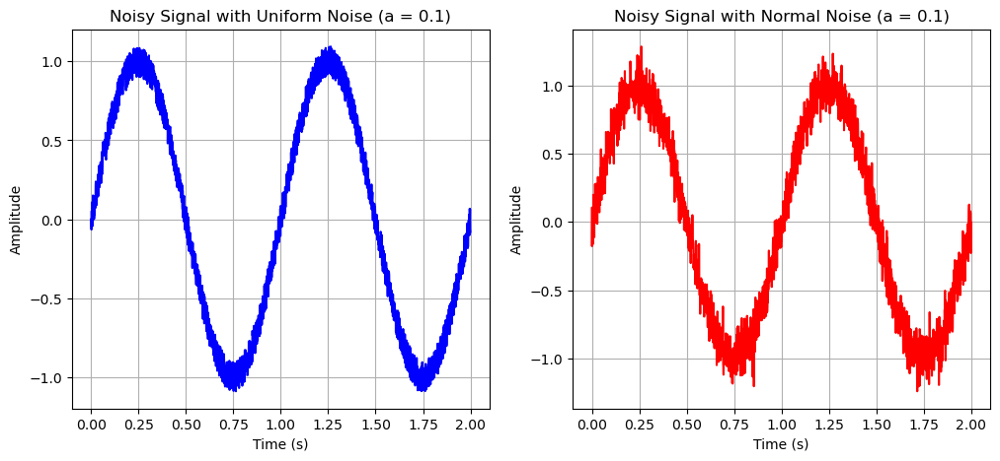

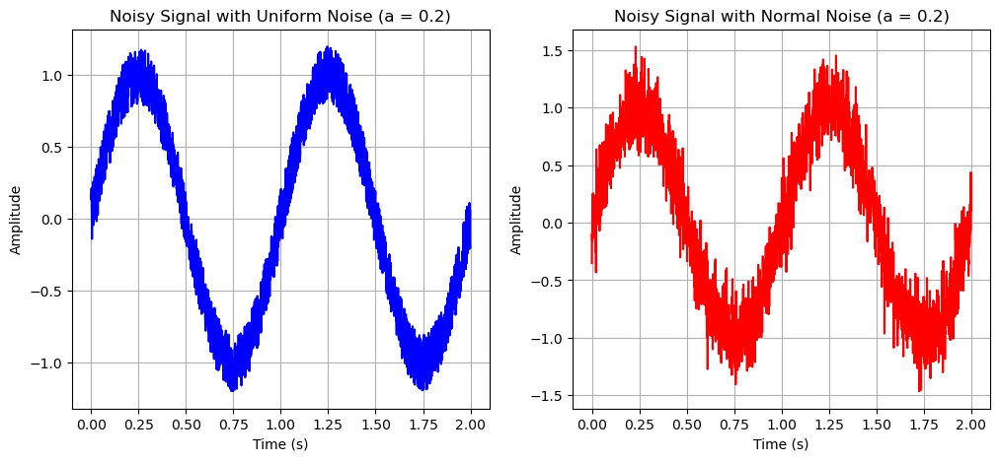

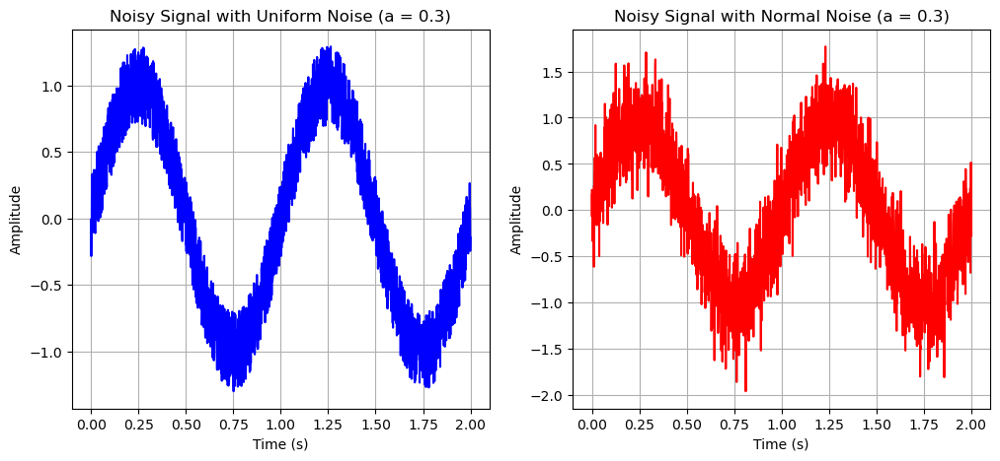

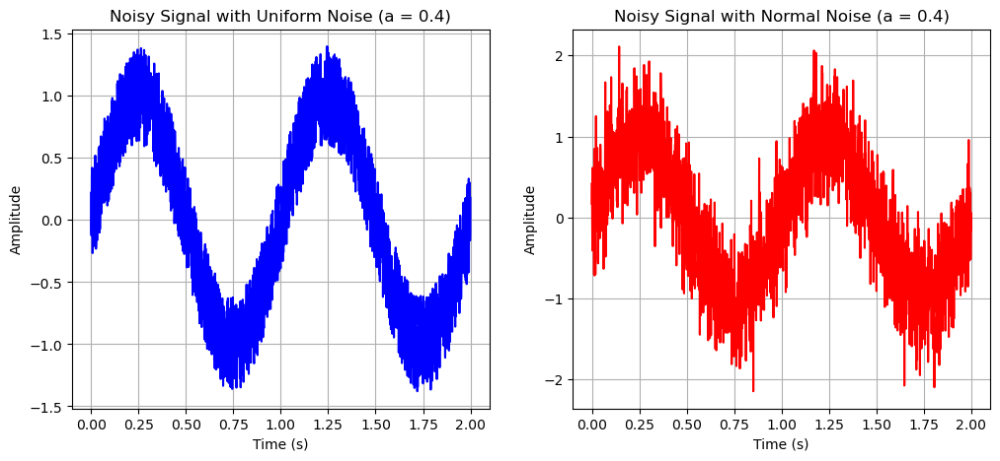

...

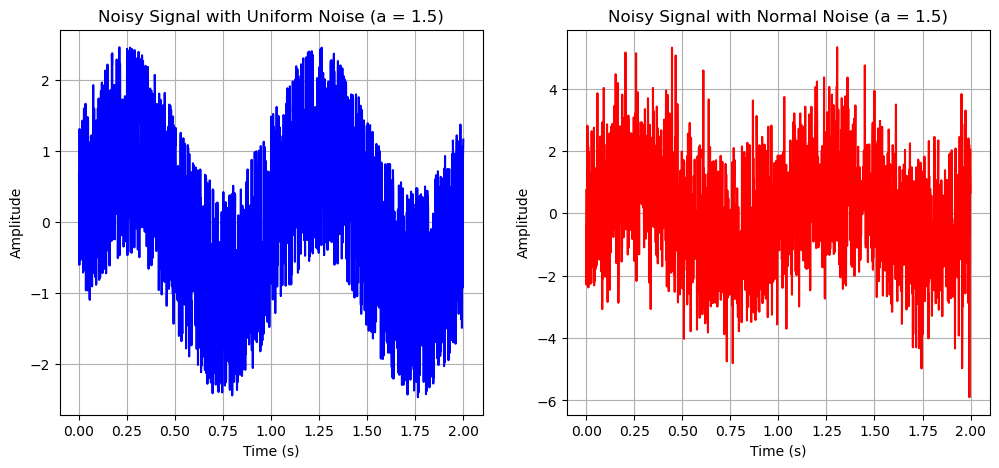

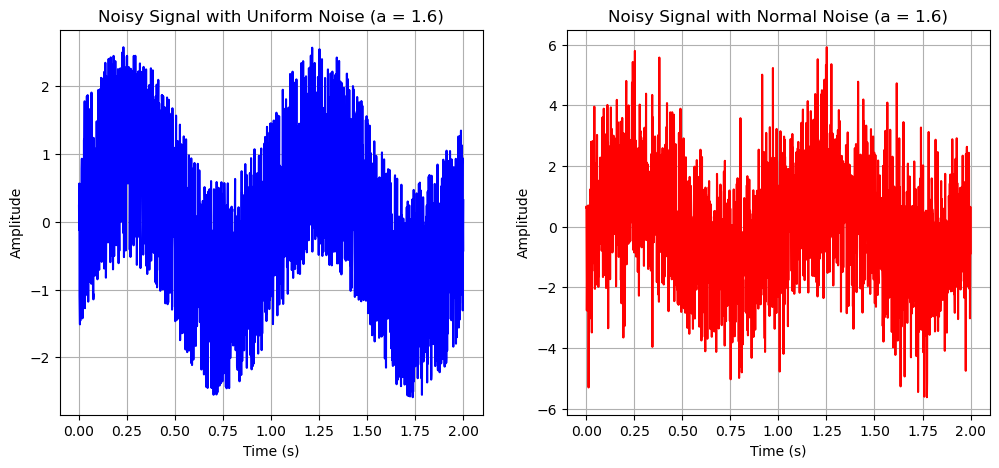

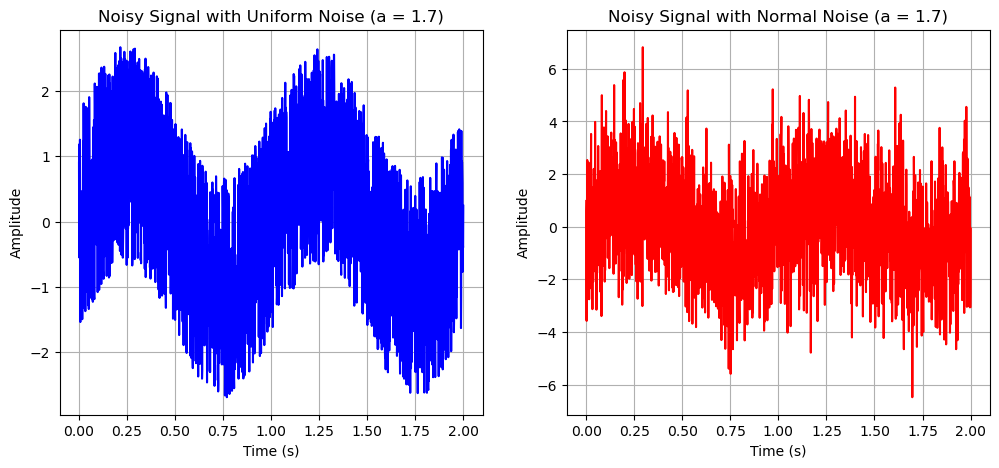

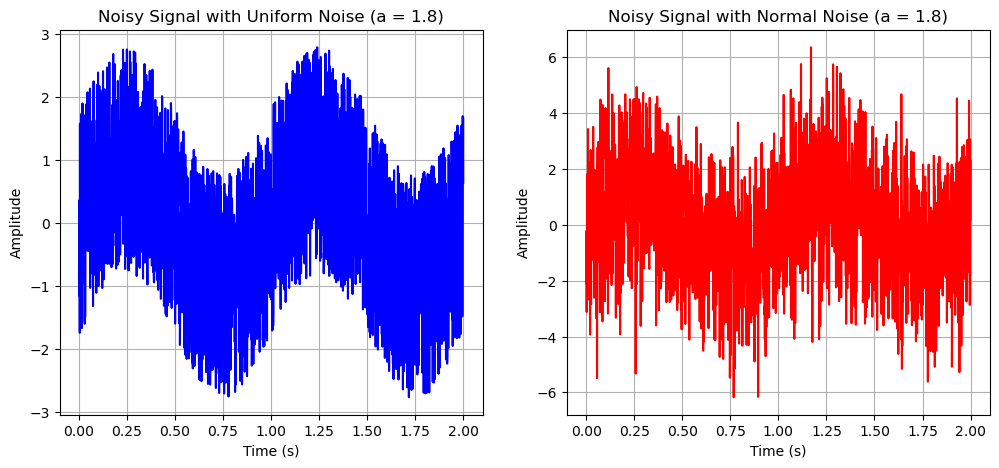

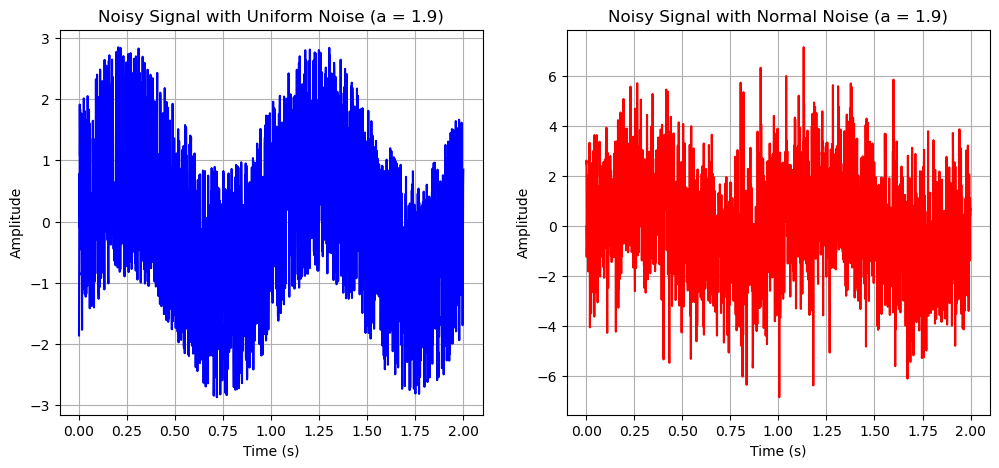

In [137]:
f0 = 1  # Frequency in Hz
sampling_rate = 1000
T = 2
t = np.linspace(0, T, T * sampling_rate)  # Time vector

x_t = np.sin(2 * np.pi * f0 * t)

# Define noise amplitude values
a_values = [round(i, 2) for i in np.arange(0, 2, 0.1)]

for a in a_values:
    N1_signal = noise(a, len(t), "uniform")  # Uniform noise
    N2_signal = noise(a, len(t), "normal")   # Normal noise

    # Create noisy signals
    xn1_t = x_t + N1_signal
    xn2_t = x_t + N2_signal

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(t, xn1_t, label=f"", color="blue") #Sinusoidal + Uniform Noise (a = {a})
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.title(f"Noisy Signal with Uniform Noise (a = {a})")
    plt.grid()

    plt.subplot(1, 2, 2)
    plt.plot(t, xn2_t, label=f"", color="red") #Sinusoidal + Normal Noise (a = {a})
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.title(f"Noisy Signal with Normal Noise (a = {a})")
    plt.grid()

    plt.show()

## <span style="color:#42eff5"> Question 4: MRI </span>

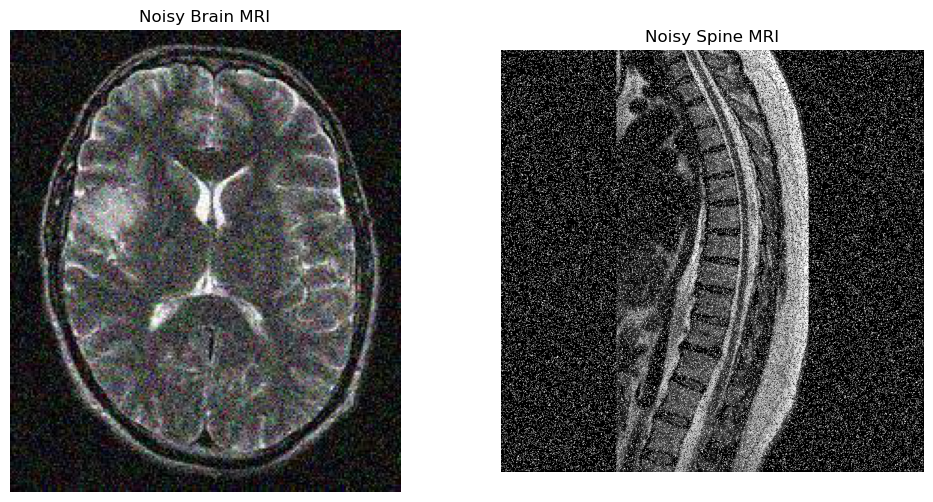

In [271]:
# Load MRI images (original and noisy)
brain_original = io.imread("./pics/tumor_original.jpg")
brain_noisy = io.imread("./pics/noisy_tumor.jpg")

spine_original = io.imread("./pics/spine_MRI_image.jpg")
spine_noisy = io.imread("./pics/noisy_spine.jpg")

# Display the noisy MRI images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(brain_noisy, cmap='gray')
axes[0].set_title("Noisy Brain MRI")
axes[0].axis("off")

axes[1].imshow(spine_noisy, cmap='gray')
axes[1].set_title("Noisy Spine MRI")
axes[1].axis("off")

plt.show()

In [279]:
def apply_mean_filter(image, kernel_size=5):
    return cv2.blur(image, (kernel_size, kernel_size))

# Apply Mean Filter
brain_mean_filtered = apply_mean_filter(brain_noisy)
spine_mean_filtered = apply_mean_filter(spine_noisy)

In [281]:
def apply_gaussian_filter(image, kernel_size=5, sigma=1):
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), sigma)

# Apply Gaussian Filter
brain_gaussian_filtered = apply_gaussian_filter(brain_noisy)
spine_gaussian_filtered = apply_gaussian_filter(spine_noisy)

In [283]:
def apply_bilateral_filter(image, d=9, sigmaColor=75, sigmaSpace=75):
    return cv2.bilateralFilter(image, d, sigmaColor, sigmaSpace)

# Apply Bilateral Filter
brain_bilateral_filtered = apply_bilateral_filter(brain_noisy)
spine_bilateral_filtered = apply_bilateral_filter(spine_noisy)

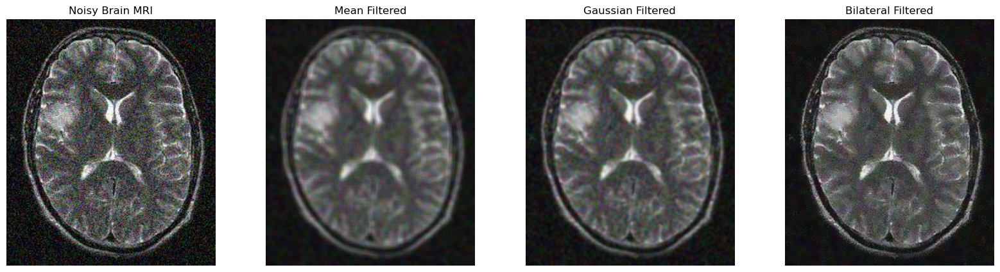

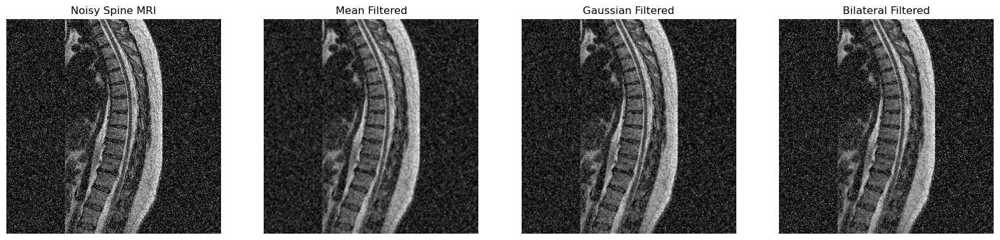

In [285]:
# Display filtering results for Brain MRI
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(brain_noisy, cmap='gray')
axes[0].set_title("Noisy Brain MRI")
axes[0].axis("off")

axes[1].imshow(brain_mean_filtered, cmap='gray')
axes[1].set_title("Mean Filtered")
axes[1].axis("off")

axes[2].imshow(brain_gaussian_filtered, cmap='gray')
axes[2].set_title("Gaussian Filtered")
axes[2].axis("off")

axes[3].imshow(brain_bilateral_filtered, cmap='gray')
axes[3].set_title("Bilateral Filtered")
axes[3].axis("off")

plt.show()

# Display filtering results for Spine MRI
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(spine_noisy, cmap='gray')
axes[0].set_title("Noisy Spine MRI")
axes[0].axis("off")

axes[1].imshow(spine_mean_filtered, cmap='gray')
axes[1].set_title("Mean Filtered")
axes[1].axis("off")

axes[2].imshow(spine_gaussian_filtered, cmap='gray')
axes[2].set_title("Gaussian Filtered")
axes[2].axis("off")

axes[3].imshow(spine_bilateral_filtered, cmap='gray')
axes[3].set_title("Bilateral Filtered")
axes[3].axis("off")

plt.show()

In [287]:
def compute_psnr(original, filtered):
    # Convert to grayscale if the image is in RGB
    if len(original.shape) == 3:
        original = cv2.cvtColor(original, cv2.COLOR_RGB2GRAY)
    if len(filtered.shape) == 3:
        filtered = cv2.cvtColor(filtered, cv2.COLOR_RGB2GRAY)

    # Ensure images are in float32 format for precision
    original = original.astype(np.float32)
    filtered = filtered.astype(np.float32)

    # Compute Mean Squared Error (MSE)
    mse = np.mean((original - filtered) ** 2)

    if mse == 0:
        return float("inf")  # No difference means infinite PSNR
    
    max_pixel = 255.0
    return 20 * np.log10(max_pixel / np.sqrt(mse))

In [289]:
# Compute PSNR for Brain MRI
psnr_brain_mean = compute_psnr(brain_original, brain_mean_filtered)
psnr_brain_gaussian = compute_psnr(brain_original, brain_gaussian_filtered)
psnr_brain_bilateral = compute_psnr(brain_original, brain_bilateral_filtered)

# Compute PSNR for Spine MRI
psnr_spine_mean = compute_psnr(spine_original, spine_mean_filtered)
psnr_spine_gaussian = compute_psnr(spine_original, spine_gaussian_filtered)
psnr_spine_bilateral = compute_psnr(spine_original, spine_bilateral_filtered)

# Display PSNR Results
print(f"Brain MRI PSNR:")
print(f"  Mean Filter: {psnr_brain_mean:.2f} dB")
print(f"  Gaussian Filter: {psnr_brain_gaussian:.2f} dB")
print(f"  Bilateral Filter: {psnr_brain_bilateral:.2f} dB")

print("\nSpine MRI PSNR:")
print(f"  Mean Filter: {psnr_spine_mean:.2f} dB")
print(f"  Gaussian Filter: {psnr_spine_gaussian:.2f} dB")
print(f"  Bilateral Filter: {psnr_spine_bilateral:.2f} dB")

Brain MRI PSNR:
  Mean Filter: 23.64 dB
  Gaussian Filter: 26.08 dB
  Bilateral Filter: 26.09 dB

Spine MRI PSNR:
  Mean Filter: 17.81 dB
  Gaussian Filter: 17.00 dB
  Bilateral Filter: 10.35 dB


## <span style="color:#42eff5"> Question 5: Filters </span>

In [291]:
def mean_filter_color(image, kernel_size=3):
    h, w, c = image.shape  # Get image dimensions
    pad_size = kernel_size // 2
    output_image = np.zeros_like(image, dtype=np.float32)
    
    for ch in range(c):  # Process each channel separately
        padded_channel = np.pad(image[:, :, ch], pad_size, mode='reflect')
        for i in range(h):
            for j in range(w):
                local_window = padded_channel[i:i+kernel_size, j:j+kernel_size]
                output_image[i, j, ch] = np.mean(local_window)
    
    return np.clip(output_image, 0, 255).astype(np.uint8)

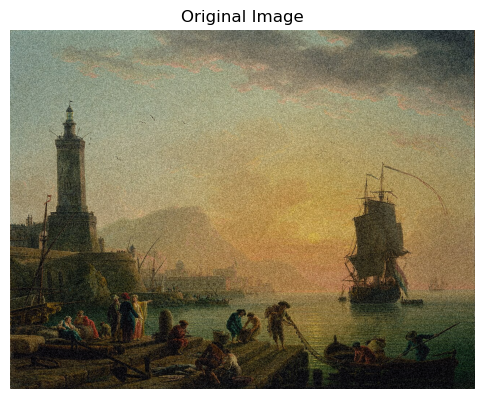

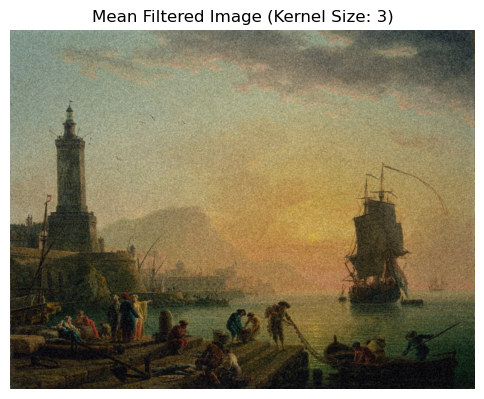

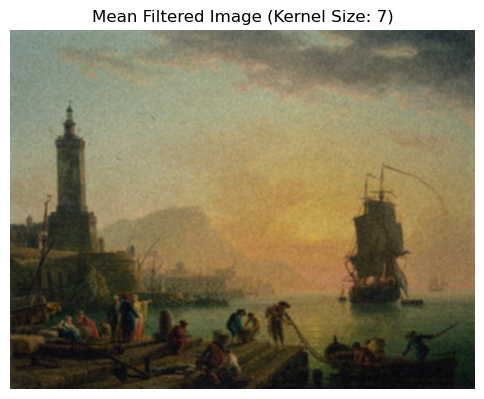

In [294]:
image_path = "./pics/A_Calm_at_a_Mediterranean_Port_noisy.png"
original_image = load_and_show(image_path, "Original Image")

counter = 1

kernel_sizes = [3, 7]  # Different kernel sizes to test
for k in kernel_sizes:
    filtered_image = mean_filter_color(original_image, kernel_size=k)
    plt.figure(figsize=(6,6))
    plt.imshow(filtered_image)
    plt.title(f"Mean Filtered Image (Kernel Size: {k})")
    plt.axis("off")
    plt.savefig(f"mean_filter_{counter}.png")
    counter += 1
    plt.show()

In [296]:
def gaussian_kernel(size, sigma=1):
    ax = np.linspace(-(size // 2), size // 2, size)
    gauss = np.exp(-0.5 * np.square(ax) / np.square(sigma))
    kernel = np.outer(gauss, gauss)
    return kernel / np.sum(kernel)  # Normalize the kernel

def gaussian_filter_color(image, kernel_size=3, sigma=1):
    h, w, c = image.shape
    pad_size = kernel_size // 2
    output_image = np.zeros_like(image, dtype=np.float32)
    kernel = gaussian_kernel(kernel_size, sigma)
    
    for ch in range(c):  # Process each channel separately
        padded_channel = np.pad(image[:, :, ch], pad_size, mode='reflect')
        for i in range(h):
            for j in range(w):
                local_window = padded_channel[i:i+kernel_size, j:j+kernel_size]
                output_image[i, j, ch] = np.sum(local_window * kernel)
    
    return np.clip(output_image, 0, 255).astype(np.uint8)

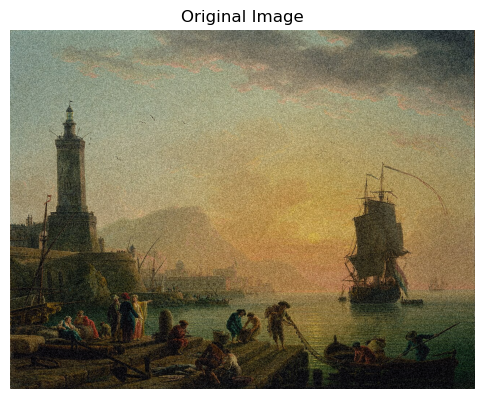

In [298]:
image_path = "./pics/A_Calm_at_a_Mediterranean_Port_noisy.png"
original_image = load_and_show(image_path, "Original Image")

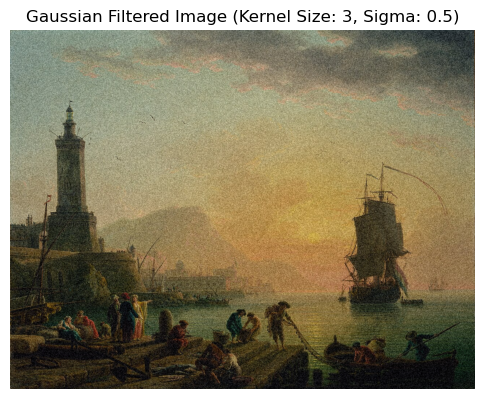

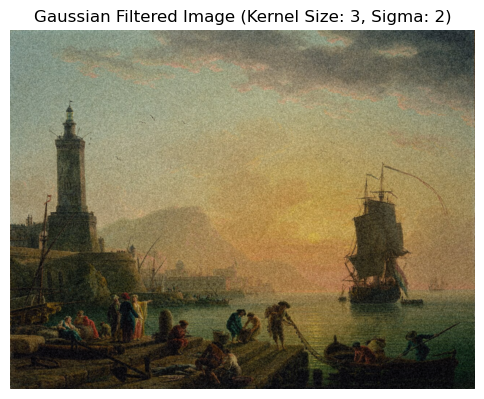

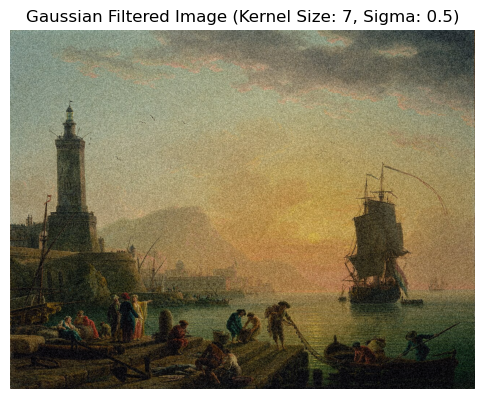

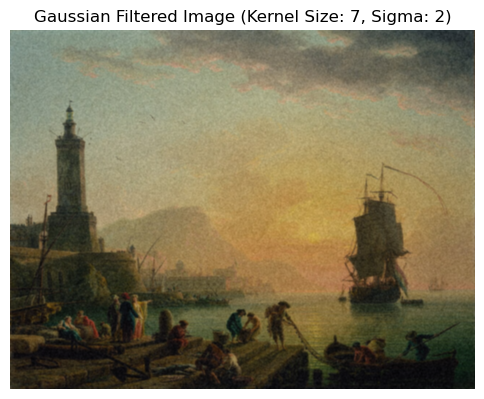

In [300]:
kernel_sizes = [3, 7]  # Different kernel sizes to test
sigmas = [0.5, 2]  # Different sigma values to test
counter = 1

for k in kernel_sizes:
    for s in sigmas:
        filtered_image = gaussian_filter_color(original_image, kernel_size=k, sigma=s)
        plt.figure(figsize=(6, 6))
        plt.imshow(filtered_image)
        plt.title(f"Gaussian Filtered Image (Kernel Size: {k}, Sigma: {s})")
        plt.axis("off")
        #plt.savefig(f"{counter}.png")  # Save the image with the counter value as the filename
        counter += 1

In [11]:
def bilateral_filter_manual(image, kernel_size=5, sigma_spatial=10, sigma_intensity=25):
    h, w, c = image.shape  # h: height, w: width, c: channels (3 for RGB)
    pad_size = kernel_size // 2
    padded_image = np.pad(image, ((pad_size, pad_size), (pad_size, pad_size), (0, 0)), mode='reflect')
    output_image = np.zeros_like(image, dtype=np.float32)

    spatial_kernel = gaussian_kernel(kernel_size, sigma_spatial)

    # Apply the bilateral filter to each color channel independently
    for channel in range(c):
        for i in range(h):
            for j in range(w):
                local_window = padded_image[i:i+kernel_size, j:j+kernel_size, channel]
                intensity_kernel = np.exp(-((local_window - image[i, j, channel])**2) / (2 * sigma_intensity**2))
                bilateral_kernel = spatial_kernel * intensity_kernel
                bilateral_kernel /= np.sum(bilateral_kernel)  # Normalize
                
                output_image[i, j, channel] = np.sum(local_window * bilateral_kernel)

    return np.clip(output_image, 0, 255).astype(np.uint8)

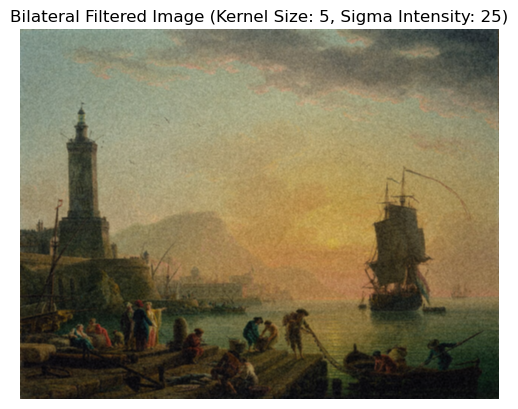

In [191]:
filtered_image = bilateral_filter_manual(original_image, kernel_size=5, sigma_spatial=10, sigma_intensity=25)
plt.imshow(filtered_image)
plt.title(f"Bilateral Filtered Image (Kernel Size: {5}, Sigma Intensity: {25})")
plt.axis("off")
plt.show()

In [64]:
def load_and_show(image_path, title="Image"):
    image = io.imread(image_path, as_gray=True)  # Force grayscale
    
    # Check if the image values are between 0 and 1
    if image.max() <= 1.0:
        image = (image * 255).astype(np.uint8)  # Scale to 0-255
    
    plt.figure(figsize=(6,6))
    plt.imshow(image, cmap='gray', vmin=0, vmax=255)
    plt.title(title)
    plt.axis("off")
    plt.show()
    
    return image

In [233]:
def calculate_snr(original, noisy):
    original = original.astype(np.float32)
    noisy = noisy.astype(np.float32)
    
    # Normalize if needed
    if original.max() > 1:
        original /= 255.0
    if noisy.max() > 1:
        noisy /= 255.0
    
    original_zero_mean = original - np.mean(original)
    noise = original - noisy
    noise_zero_mean = noise - np.mean(noise)
    
    # Signal and noise power calculation
    signal_power = np.mean(original_zero_mean ** 2)
    noise_power = np.mean(noise_zero_mean ** 2)
    
    if noise_power == 0:
        return float('inf')
    
    # Final SNR calculation
    return 10 * np.log10(signal_power / (noise_power + 1e-8))

In [245]:
def calculate_psnr(original, filtered, zero_mean=False):
    original = original.astype(np.float32)
    filtered = filtered.astype(np.float32)
    
    # Normalize if needed
    if original.max() > 1:
        original /= 255.0
    if filtered.max() > 1:
        filtered /= 255.0
    
    if zero_mean:
        original = original - np.mean(original)
        filtered = filtered - np.mean(filtered)
    
    # Mean Squared Error (MSE)
    mse = np.mean((original - filtered) ** 2)
    
    if mse == 0:
        return float('inf')  # Perfect reconstruction
    
    # Dynamic max pixel value
    max_pixel_value = 1.0 if original.max() <= 1 else 255.0
    
    # PSNR calculation
    psnr = 20 * np.log10(max_pixel_value / np.sqrt(mse))
    return psnr

In [9]:
def mean_filter_gray(image, kernel_size=3):
    h, w = image.shape
    pad_size = kernel_size // 2
    output_image = np.zeros_like(image, dtype=np.float32)
    padded_image = np.pad(image, pad_size, mode='reflect')
    
    for i in range(h):
        for j in range(w):
            local_window = padded_image[i:i+kernel_size, j:j+kernel_size]
            output_image[i, j] = np.mean(local_window)
    
    return np.clip(output_image, 0, 255).astype(np.uint8)

In [11]:
def gaussian_kernel(size, sigma=1):
    ax = np.linspace(-(size // 2), size // 2, size)
    gauss = np.exp(-0.5 * np.square(ax) / np.square(sigma))
    kernel = np.outer(gauss, gauss)
    return kernel / np.sum(kernel)

def gaussian_filter_gray(image, kernel_size=3, sigma=1):
    h, w = image.shape
    pad_size = kernel_size // 2
    output_image = np.zeros_like(image, dtype=np.float32)
    kernel = gaussian_kernel(kernel_size, sigma)
    padded_image = np.pad(image, pad_size, mode='reflect')
    
    for i in range(h):
        for j in range(w):
            local_window = padded_image[i:i+kernel_size, j:j+kernel_size]
            output_image[i, j] = np.sum(local_window * kernel)
    
    return np.clip(output_image, 0, 255).astype(np.uint8)

In [13]:
def bilateral_filter_gray(image, kernel_size=5, sigma_spatial=10, sigma_intensity=25):
    h, w = image.shape
    pad_size = kernel_size // 2
    padded_image = np.pad(image, pad_size, mode='reflect')
    output_image = np.zeros_like(image, dtype=np.float32)
    spatial_kernel = gaussian_kernel(kernel_size, sigma_spatial)
    
    for i in range(h):
        for j in range(w):
            local_window = padded_image[i:i+kernel_size, j:j+kernel_size]
            intensity_kernel = np.exp(-((local_window - image[i, j])**2) / (2 * sigma_intensity**2))
            bilateral_kernel = spatial_kernel * intensity_kernel
            bilateral_kernel /= np.sum(bilateral_kernel)
            
            output_image[i, j] = np.sum(local_window * bilateral_kernel)
    
    return np.clip(output_image, 0, 255).astype(np.uint8)

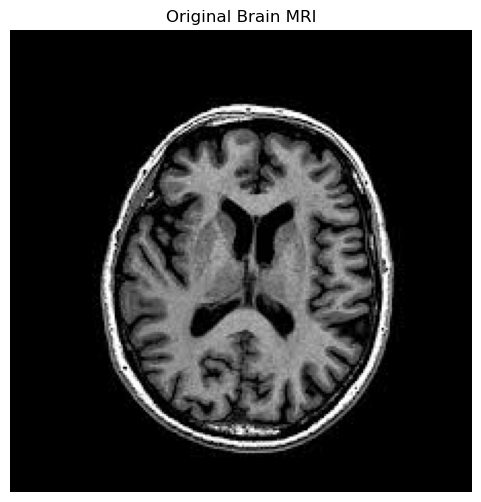

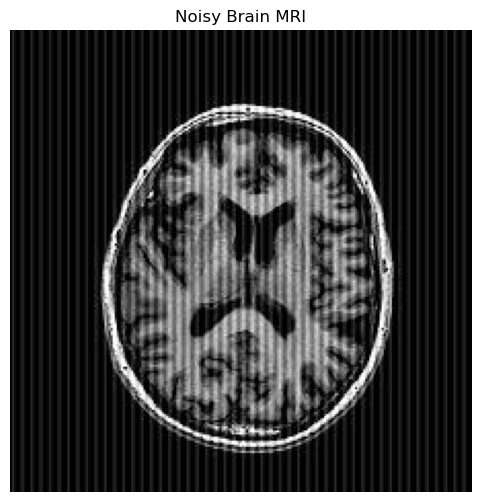

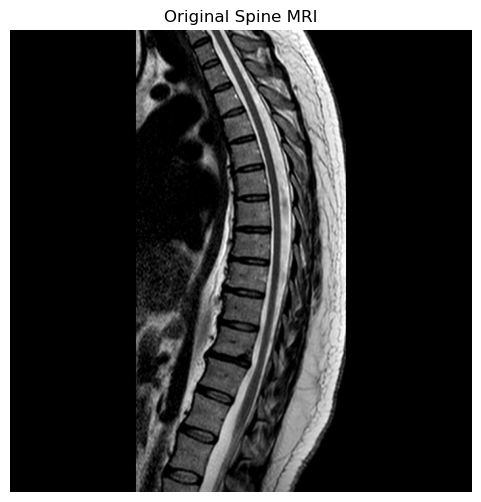

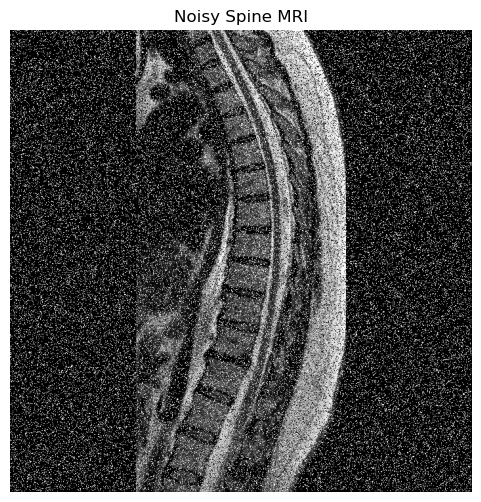

In [66]:
# Load images
original_brain = load_and_show("./pics/original_brain_mri.jpg", "Original Brain MRI")
noisy_brain = load_and_show("./pics/noisy_brain_mri.jpg", "Noisy Brain MRI")
original_spine = load_and_show("./pics/original_spine_mri.jpg", "Original Spine MRI")
noisy_spine = load_and_show("./pics/noisy_spine_mri.jpg", "Noisy Spine MRI")

In [78]:
# Apply filters to noisy images
mean_brain = mean_filter_gray(noisy_brain)
gaussian_brain = gaussian_filter_gray(noisy_brain)
bilateral_brain = bilateral_filter_gray(noisy_brain)

mean_spine = mean_filter_gray(noisy_spine)
gaussian_spine = gaussian_filter_gray(noisy_spine)
bilateral_spine = bilateral_filter_gray(noisy_spine)

# Save output images
# cv2.imwrite("./mean_brain.jpg", mean_brain)
# cv2.imwrite("./gaussian_brain.jpg", gaussian_brain)
# cv2.imwrite("./bilateral_brain.jpg", bilateral_brain)
# cv2.imwrite("./mean_spine.jpg", mean_spine)
# cv2.imwrite("./gaussian_spine.jpg", gaussian_spine)
# cv2.imwrite("./bilateral_spine.jpg", bilateral_spine)

In [247]:
# Compare results using PSNR and SNR
results = {
    "Brain MRI": {
        "Mean Filter": (calculate_psnr(original_brain, mean_brain), calculate_snr(original_brain, mean_brain)),
        "Gaussian Filter": (calculate_psnr(original_brain, gaussian_brain), calculate_snr(original_brain, gaussian_brain)),
        "Bilateral Filter": (calculate_psnr(original_brain, bilateral_brain), calculate_snr(original_brain, bilateral_brain))
    },
    "Spine MRI": {
        "Mean Filter": (calculate_psnr(original_spine, mean_spine), calculate_snr(original_spine, mean_spine)),
        "Gaussian Filter": (calculate_psnr(original_spine, gaussian_spine), calculate_snr(original_spine, gaussian_spine)),
        "Bilateral Filter": (calculate_psnr(original_spine, bilateral_spine), calculate_snr(original_spine, bilateral_spine))
    }
}

# Display results
for img_type, filters in results.items():
    print(f"{img_type} Results:")
    for filter_name, (psnr, snr) in filters.items():
        print(f"  {filter_name}: PSNR = {psnr:.2f} dB, SNR = {snr:.2f} dB")
    print("\n")

Brain MRI Results:
  Mean Filter: PSNR = 21.79 dB, SNR = 9.98 dB
  Gaussian Filter: PSNR = 22.11 dB, SNR = 10.32 dB
  Bilateral Filter: PSNR = 20.37 dB, SNR = 8.32 dB


Spine MRI Results:
  Mean Filter: PSNR = 16.53 dB, SNR = 5.64 dB
  Gaussian Filter: PSNR = 16.30 dB, SNR = 5.29 dB
  Bilateral Filter: PSNR = 17.62 dB, SNR = 7.64 dB




In [70]:
def show_filtered_images(filtered_images, titles):
    plt.figure(figsize=(12, 8))
    for i, (img, title) in enumerate(zip(filtered_images, titles)):
        plt.subplot(2, 3, i + 1)
        plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.axis("off")
    plt.show()

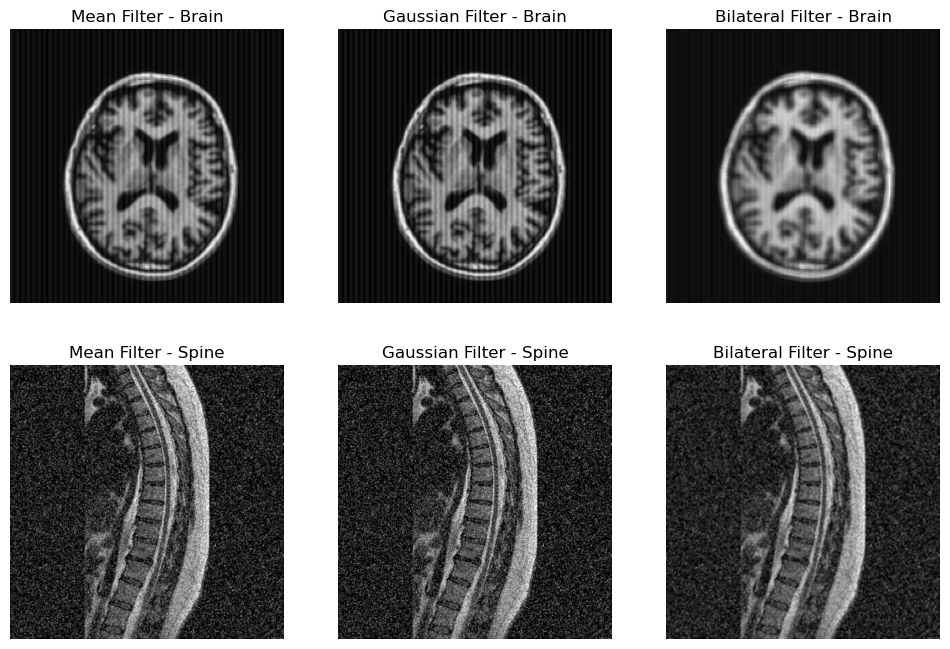

In [72]:
show_filtered_images([mean_brain, gaussian_brain, bilateral_brain, mean_spine, gaussian_spine, bilateral_spine],
                     ["Mean Filter - Brain", "Gaussian Filter - Brain", "Bilateral Filter - Brain", 
                      "Mean Filter - Spine", "Gaussian Filter - Spine", "Bilateral Filter - Spine"])

## <span style="color:#42eff5"> Question 6: Adaptive Filter </span>

In [185]:
def adaptive_filter(image, desired_image, filter_size=(3, 3), learning_rate=0.01, max_iter=100):
    image = img_as_float(image)
    desired_image = img_as_float(desired_image)

    kernel_height, kernel_width = filter_size
    half_kh, half_kw = kernel_height // 2, kernel_width // 2

    weights = np.ones(filter_size) / (kernel_height * kernel_width)
    filtered_image = np.zeros_like(image)
    count_matrix = np.zeros_like(image)

    for _ in range(max_iter):
        for i in range(half_kh, image.shape[0] - half_kh):
            for j in range(half_kw, image.shape[1] - half_kw):
                patch = image[i - half_kh:i + half_kh + 1, j - half_kw:j + half_kw + 1]
                y = np.sum(weights * patch)
                error = desired_image[i, j] - y

                norm_factor = np.sum(patch**2) + 1e-8
                weights += (learning_rate * error * patch) / norm_factor

                filtered_image[i, j] += y
                count_matrix[i, j] += 1

    filtered_image /= (count_matrix + 1e-8)
    return np.clip(filtered_image, 0, 1)

In [187]:
def tune_learning_rate(noisy_image, desired_image, filter_size=(3, 3), initial_rate=0.1, decay=0.98, tolerance=1e-3):
    current_rate = initial_rate
    previous_error = np.inf
    max_iter = 20

    for _ in range(max_iter):
        filtered_image = adaptive_filter(noisy_image, desired_image, filter_size, current_rate, max_iter=5)
        
        mse = np.mean((desired_image - filtered_image) ** 2)
        snr = 10 * np.log10(np.mean(desired_image ** 2) / (mse + 1e-8))
        
        print(f"Learning Rate: {current_rate:.5f}, MSE: {mse:.6f}, SNR: {snr:.2f} dB")

        if abs(previous_error - mse) < tolerance:
            break  # Convergence achieved
        
        current_rate *= decay
        previous_error = mse

    return current_rate

In [189]:
noisy_image = noisy_brain
desired_image = original_brain

# Ensure images are of the same dimensions
assert noisy_image.shape == desired_image.shape, "Images must have the same dimensions."

# Tune learning rate
optimal_rate = tune_learning_rate(noisy_image, desired_image)
print(f"Optimal Learning Rate: {optimal_rate}")

# Apply adaptive filter
brain_adaptive_filtered = adaptive_filter(noisy_image, desired_image, learning_rate=optimal_rate)

cv2.imwrite("adaptive_filter_brain.jpg", img_as_ubyte(brain_adaptive_filtered))
print("Adaptive filtering completed.")

Learning Rate: 0.10000, MSE: 4904.928381, SNR: -21.35 dB
Learning Rate: 0.09800, MSE: 4904.999464, SNR: -21.35 dB
Learning Rate: 0.09604, MSE: 4905.071388, SNR: -21.35 dB
Learning Rate: 0.09412, MSE: 4905.144119, SNR: -21.35 dB
Learning Rate: 0.09224, MSE: 4905.217680, SNR: -21.35 dB
Learning Rate: 0.09039, MSE: 4905.292054, SNR: -21.35 dB
Learning Rate: 0.08858, MSE: 4905.367257, SNR: -21.35 dB
Learning Rate: 0.08681, MSE: 4905.443249, SNR: -21.35 dB
Learning Rate: 0.08508, MSE: 4905.520034, SNR: -21.35 dB
Learning Rate: 0.08337, MSE: 4905.597616, SNR: -21.35 dB
Learning Rate: 0.08171, MSE: 4905.675970, SNR: -21.35 dB
Learning Rate: 0.08007, MSE: 4905.755086, SNR: -21.35 dB
Learning Rate: 0.07847, MSE: 4905.834960, SNR: -21.35 dB
Learning Rate: 0.07690, MSE: 4905.915566, SNR: -21.35 dB
Learning Rate: 0.07536, MSE: 4905.996884, SNR: -21.35 dB
Learning Rate: 0.07386, MSE: 4906.078905, SNR: -21.35 dB
Learning Rate: 0.07238, MSE: 4906.161604, SNR: -21.35 dB
Learning Rate: 0.07093, MSE: 49

In [191]:
def load_and_show(image, title="Image"): 
    # If the image is in float format, scale it to 0-255 for display
    if image.max() <= 1.0:  # Check if it's a float image
        image = img_as_ubyte(image)

    plt.figure(figsize=(6,6))
    plt.imshow(image, cmap='gray', vmin=0, vmax=255)
    plt.title(title)
    plt.axis("off")
    plt.show()
    
    return image  # Return grayscale image

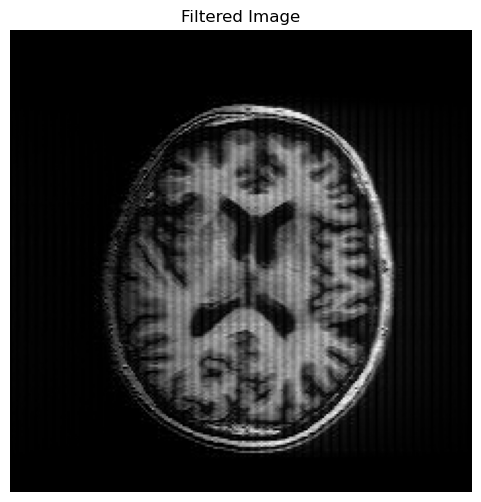

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [193]:
load_and_show(brain_adaptive_filtered, title="Filtered Image")

In [195]:
noisy_image = noisy_spine
desired_image = original_spine

# Ensure images are of the same dimensions
assert noisy_image.shape == desired_image.shape, "Images must have the same dimensions."

# Tune learning rate
optimal_rate = tune_learning_rate(noisy_image, desired_image)
print(f"Optimal Learning Rate: {optimal_rate}")

# Apply adaptive filter
spine_adaptive_filtered = adaptive_filter(noisy_image, desired_image, learning_rate=optimal_rate)

cv2.imwrite("adaptive_filter_spine.jpg", img_as_ubyte(spine_adaptive_filtered))
print("Adaptive filtering completed.")

Learning Rate: 0.10000, MSE: 4671.247588, SNR: -20.74 dB
Learning Rate: 0.09800, MSE: 4671.290404, SNR: -20.74 dB
Learning Rate: 0.09604, MSE: 4671.333732, SNR: -20.74 dB
Learning Rate: 0.09412, MSE: 4671.377579, SNR: -20.74 dB
Learning Rate: 0.09224, MSE: 4671.421960, SNR: -20.74 dB
Learning Rate: 0.09039, MSE: 4671.466879, SNR: -20.74 dB
Learning Rate: 0.08858, MSE: 4671.512343, SNR: -20.74 dB
Learning Rate: 0.08681, MSE: 4671.558358, SNR: -20.74 dB
Learning Rate: 0.08508, MSE: 4671.604942, SNR: -20.74 dB
Learning Rate: 0.08337, MSE: 4671.652110, SNR: -20.74 dB
Learning Rate: 0.08171, MSE: 4671.699869, SNR: -20.74 dB
Learning Rate: 0.08007, MSE: 4671.748223, SNR: -20.74 dB
Learning Rate: 0.07847, MSE: 4671.797185, SNR: -20.74 dB
Learning Rate: 0.07690, MSE: 4671.846763, SNR: -20.74 dB
Learning Rate: 0.07536, MSE: 4671.896965, SNR: -20.74 dB
Learning Rate: 0.07386, MSE: 4671.947801, SNR: -20.74 dB
Learning Rate: 0.07238, MSE: 4671.999283, SNR: -20.74 dB
Learning Rate: 0.07093, MSE: 46

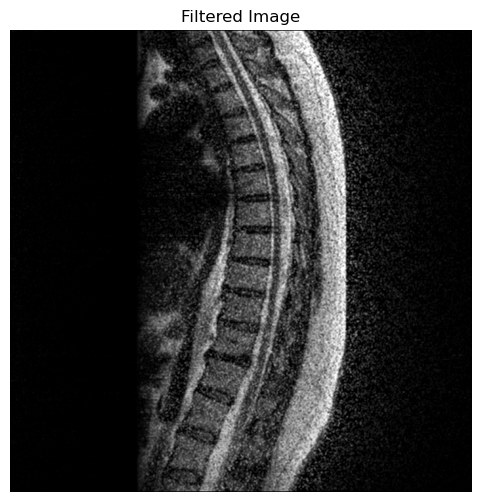

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 2, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [197]:
load_and_show(spine_adaptive_filtered, title="Filtered Image")

In [249]:
# Compute PSNR for Adaptive Filter
psnr_brain_adaptive = calculate_psnr(original_brain, brain_adaptive_filtered)
psnr_spine_adaptive = calculate_psnr(original_spine, spine_adaptive_filtered)

print(f"Adaptive Filter PSNR for Brain MRI: {psnr_brain_adaptive:.2f} dB")
print(f"Adaptive Filter PSNR for Spine MRI: {psnr_spine_adaptive:.2f} dB")

Adaptive Filter PSNR for Brain MRI: 20.23 dB
Adaptive Filter PSNR for Spine MRI: 21.11 dB


In [251]:
# Compute PSNR for all filters (Brain MRI)
psnr_brain_mean = calculate_psnr(original_brain, mean_brain)
psnr_brain_gaussian = calculate_psnr(original_brain, gaussian_brain)
psnr_brain_bilateral = calculate_psnr(original_brain, bilateral_brain)


# Compute PSNR for all filters (Spine MRI)
psnr_spine_mean = calculate_psnr(original_spine, mean_spine)
psnr_spine_gaussian = calculate_psnr(original_spine, gaussian_spine)
psnr_spine_bilateral = calculate_psnr(original_spine, bilateral_spine)

print(f"Brain MRI PSNR - Mean: {psnr_brain_mean:.2f} | Gaussian: {psnr_brain_gaussian:.2f} | Bilateral: {psnr_brain_bilateral:.2f} | Adaptive: {psnr_brain_adaptive:.2f}")
print(f"Spine MRI PSNR - Mean: {psnr_spine_mean:.2f} | Gaussian: {psnr_spine_gaussian:.2f} | Bilateral: {psnr_spine_bilateral:.2f} | Adaptive: {psnr_spine_adaptive:.2f}")

Brain MRI PSNR - Mean: 21.79 | Gaussian: 22.11 | Bilateral: 20.37 | Adaptive: 20.23
Spine MRI PSNR - Mean: 16.53 | Gaussian: 16.30 | Bilateral: 17.62 | Adaptive: 21.11


In [253]:
# Compute SNR for all filters (Brain MRI)
snr_brain_mean = calculate_snr(original_brain, mean_brain)
snr_brain_gaussian = calculate_snr(original_brain, gaussian_brain)
snr_brain_bilateral = calculate_snr(original_brain, bilateral_brain)
snr_brain_adaptive = calculate_snr(original_brain, brain_adaptive_filtered)

# Compute SNR for all filters (Spine MRI)
snr_spine_mean = calculate_snr(original_spine, mean_spine)
snr_spine_gaussian = calculate_snr(original_spine, gaussian_spine)
snr_spine_bilateral = calculate_snr(original_spine, bilateral_spine)
snr_spine_adaptive = calculate_snr(original_spine, spine_adaptive_filtered)

print(f"Brain MRI SNR - Mean: {snr_brain_mean:.2f} | Gaussian: {snr_brain_gaussian:.2f} | Bilateral: {snr_brain_bilateral:.2f} | Adaptive: {snr_brain_adaptive:.2f}")
print(f"Spine MRI SNR - Mean: {snr_spine_mean:.2f} | Gaussian: {snr_spine_gaussian:.2f} | Bilateral: {snr_spine_bilateral:.2f} | Adaptive: {snr_spine_adaptive:.2f}")

Brain MRI SNR - Mean: 9.98 | Gaussian: 10.32 | Bilateral: 8.32 | Adaptive: 7.88
Spine MRI SNR - Mean: 5.64 | Gaussian: 5.29 | Bilateral: 7.64 | Adaptive: 8.54


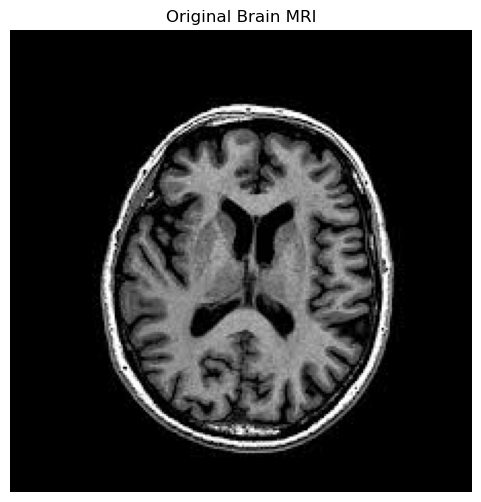

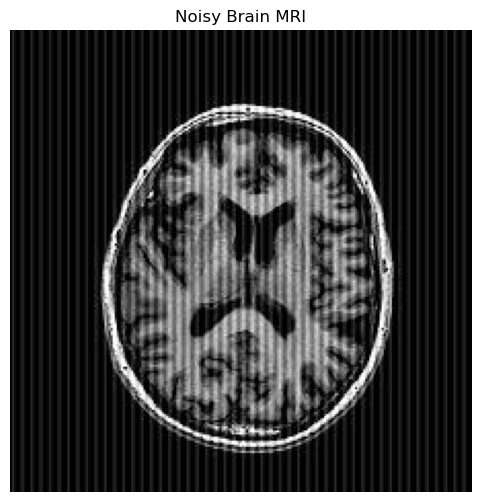

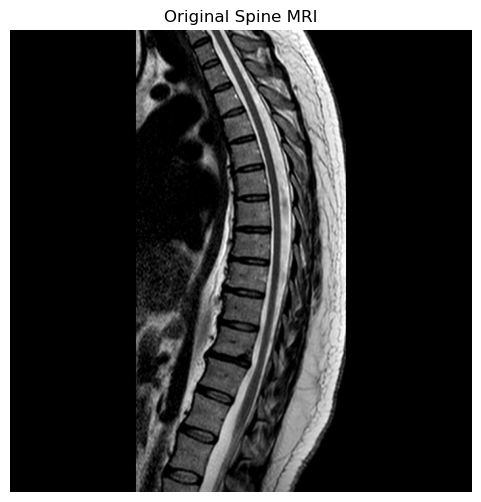

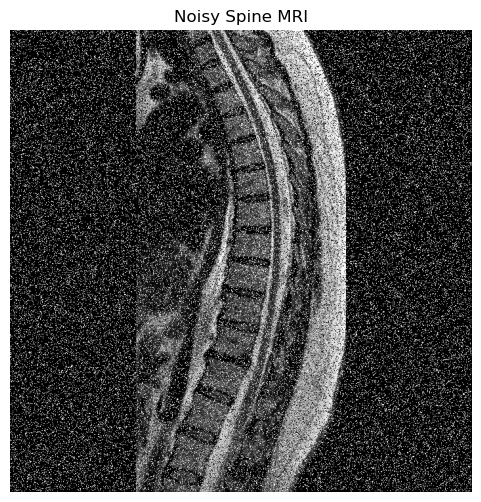

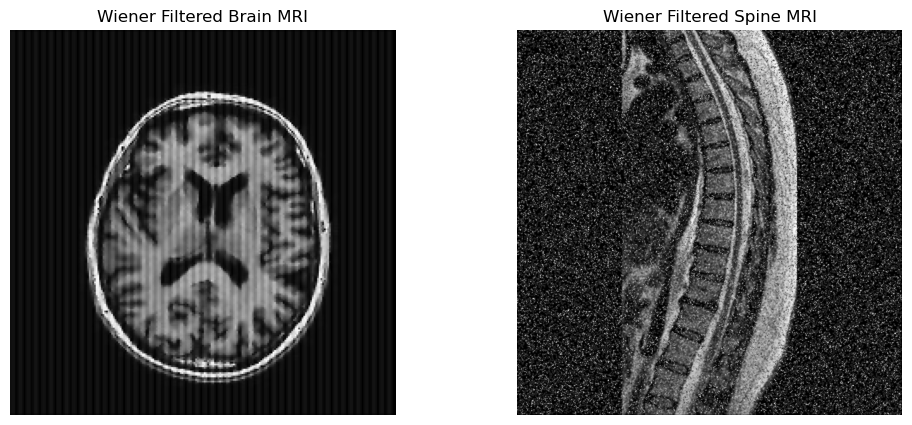

Wiener Filter (Brain MRI) - PSNR: 23.59 dB, SNR: 12.31 dB
Wiener Filter (Spine MRI) - PSNR: 14.52 dB, SNR: 2.96 dB


True

In [259]:
# just for comparison between the built-in function and the manual one

# Apply Wiener Filter
def apply_wiener_filter(noisy_image, mysize=3):
    # Convert to float in range [0, 1] before filtering
    noisy_image = img_as_float(noisy_image)
    return wiener(noisy_image, mysize=mysize)

# Load and Show Function (already provided)
def load_and_show(image_path, title="Image"):
    image = io.imread(image_path, as_gray=True)
    
    # Check if the image values are between 0 and 1
    if image.max() <= 1.0:
        image = (image * 255).astype(np.uint8)
    
    plt.figure(figsize=(6, 6))
    plt.imshow(image, cmap='gray', vmin=0, vmax=255)
    plt.title(title)
    plt.axis("off")
    plt.show()
    
    return image

original_brain = load_and_show("./pics/original_brain_mri.jpg", "Original Brain MRI")
noisy_brain = load_and_show("./pics/noisy_brain_mri.jpg", "Noisy Brain MRI")
original_spine = load_and_show("./pics/original_spine_mri.jpg", "Original Spine MRI")
noisy_spine = load_and_show("./pics/noisy_spine_mri.jpg", "Noisy Spine MRI")

# Apply Wiener Filter to both Brain and Spine MRIs
wiener_brain_filtered = apply_wiener_filter(noisy_brain)
wiener_spine_filtered = apply_wiener_filter(noisy_spine)

# Ensure filtered images are in the [0, 1] range before converting to uint8
wiener_brain_filtered = np.clip(wiener_brain_filtered, 0, 1)
wiener_spine_filtered = np.clip(wiener_spine_filtered, 0, 1)

# Calculate SNR and PSNR
brain_snr = calculate_snr(original_brain, wiener_brain_filtered)
brain_psnr = calculate_psnr(original_brain, wiener_brain_filtered)

spine_snr = calculate_snr(original_spine, wiener_spine_filtered)
spine_psnr = calculate_psnr(original_spine, wiener_spine_filtered)

# Display Filtered Images
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.title('Wiener Filtered Brain MRI')
plt.imshow(wiener_brain_filtered, cmap='gray', vmin=0, vmax=1)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Wiener Filtered Spine MRI')
plt.imshow(wiener_spine_filtered, cmap='gray', vmin=0, vmax=1)
plt.axis('off')

plt.show()

# Print Results
print(f'Wiener Filter (Brain MRI) - PSNR: {brain_psnr:.2f} dB, SNR: {brain_snr:.2f} dB')
print(f'Wiener Filter (Spine MRI) - PSNR: {spine_psnr:.2f} dB, SNR: {spine_snr:.2f} dB')

# Save Filtered Images
cv2.imwrite("wiener_filtered_brain.jpg", img_as_ubyte(wiener_brain_filtered))
cv2.imwrite("wiener_filtered_spine.jpg", img_as_ubyte(wiener_spine_filtered))

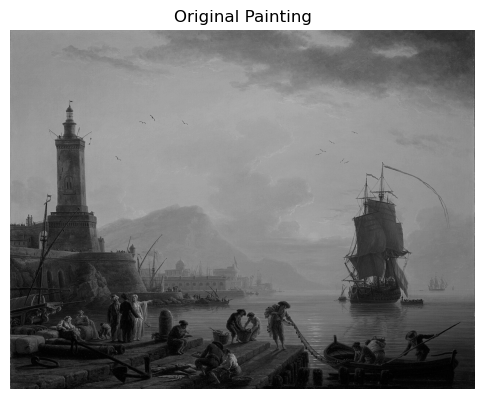

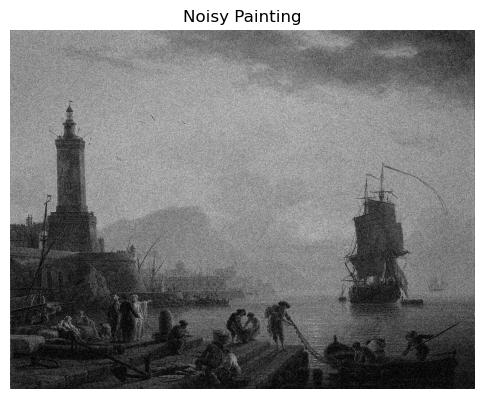

Learning Rate: 0.10000, MSE: 14225.906942, SNR: -21.43 dB
Learning Rate: 0.09800, MSE: 14225.907487, SNR: -21.43 dB
Optimal Learning Rate: 0.098
Adaptive filtering completed.


In [261]:
original_painting = load_and_show("./pics/A_Calm_at_a_Mediterranean_Port.jpg", "Original Painting")
noisy_painting = load_and_show("./pics/A_Calm_at_a_Mediterranean_Port_noisy.png", "Noisy Painting")

# Load images (noisy and reference)
noisy_image = noisy_painting
desired_image = original_painting

# Ensure images are of the same dimensions
assert noisy_image.shape == desired_image.shape, "Images must have the same dimensions."

# Tune learning rate
optimal_rate = tune_learning_rate(noisy_image, desired_image)
print(f"Optimal Learning Rate: {optimal_rate}")

# Apply adaptive filter
painting_adaptive_filtered = adaptive_filter(noisy_image, desired_image, learning_rate=optimal_rate)

# Save or display results
cv2.imwrite("adaptive_filter_painting.jpg", img_as_ubyte(spine_adaptive_filtered))
print("Adaptive filtering completed.")